In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import os
import shutil
import cython
from ripser import ripser, plot_dgms
from scipy.fftpack import fft,ifft
import wfdb
from scipy import signal
from gwpy.spectrogram import Spectrogram

In [9]:

def theStart(aString):
    print(aString)
    theSamp = wfdb.rdsamp('/home/dr-dunstan/Downloads/training2017/' + aString)
    #fields = wfdb.rdrecord('/home/dr-dunstan/Downloads/training2017/A00061')
    #wfdb.plot_wfdb(record=fields, title='Record A00061 from Physionet Challenge 2017')

    theX = []
    for i in range(0,len(theSamp[0])):
    #print(theSamp[0][i][0])
        theX.append(theSamp[0][i][0])


#print(theX)
    values, ybins, xbins, im = plt.specgram(theX,Fs=300)
    print(xbins)
    #plt.xlabel('Time')

    #plt.ylabel('Frequency')

 

    plt.show()
    theGoodList = stepTwo(values,ybins,xbins,im)
    print("good List")
    print(theGoodList)
    longSegment = getLongestSegment(theGoodList)
    print("longest")
    print(longSegment)
    signalVals = getSignalVals(longSegment,theX,xbins)
    #print("Samp")
    #print(signalVals)
    plotSave(signalVals,aString)
    

In [10]:
def stepTwo(values,ybins,xbins,im):
    #print(theVal)
    theVal = values.transpose() 
    minFreq = 0
    maxFreq = 50
    minFreqIndex = ""
    maxFreqIndex = ""
    theThreshold =  .000001

    countMode = 0

    if (minFreq == 0):
        minFreqIndex = 0
        countMode = 1

    for i in range(len(ybins)-1):
        if(ybins[i] < minFreq and ybins[i+1] > minFreq):
            minFreqIndex = i+1
        if(ybins[i] < maxFreq and ybins[i+1] > maxFreq):
            maxFreqIndex = i

#print(minFreqIndex)
#print(maxFreqIndex)

    theList = []
    theList2 = []
    theGoodList = []
    countMode = 0
    badMode = 0

    for i in range(len(theVal)):
        for j in range(len(theVal[i])):
        #if freq is too low 
            if(j < minFreqIndex):
                if(theVal[i][j] > theThreshold):
                #print("Bad freq exsists (Low) at " + str(i))
                    if(countMode == 0):
                        theList.append(i)
                        countMode += 1
            elif(j > maxFreqIndex):
                if(theVal[i][j] > theThreshold):
                #print("Bad freq exsists (High) at " + str(i)
                    badMode += 1
                    if(countMode == 1):
                        theList2.append(i)
                        countMode += 1
                    
        if(badMode == 0):
            theGoodList.append(i)
        else:
            badMode = 0
    
        countMode = 0
        if(minFreq == 0):
            countMode = 1
    #print(len(theList))
    #print(len(theList2))
    return (theGoodList)

In [11]:
maxLen = 0
first = 0 
last = 0
temp = 0

def getLongestSegment(aList):
    maxLen = 0
    first = 0
    if(len(aList) != 0):
        last = aList[0]
        first = aList[0]
    aTemp = []
    aTemp2 = []
    aTemp3 = []
    maxList = []
    finalList = []
    maxIndex = 0
    for i in range(0,len(aList) -1):
        aTemp.append(aList[i+1] - aList[i])
    
    print(aTemp)
    
    for i in range(len(aTemp)):
        if(aTemp[i] != 1):
            aTemp[i] = "NO"
            
    
    for i in range(len(aTemp)):
        if(aTemp[i] != 1):
            aTemp3.append(aTemp2)
            aTemp2 = []
            tempMode = 0
        else:
            aTemp2.append(i+1)
            tempMode = 1
    #finTemp.append
    
    if(len(aTemp3) == 0):
        aTemp3.append(aTemp2)
    
    
    
    
    print("the temp 3")
    print(aTemp3)
    
    for element in aTemp3:
        if(maxIndex < len(element)):
            maxList = element
            maxIndex = len(element)
    
    for element in maxList:
        finalList.append(aList[element])
    
    #print(maxList)
    if(len(maxList) != 0):
        finalList.insert(0, aList[maxList[0]] - 1)
        
    
    print(finalList)    
    return(finalList)


def getSignalVals(aList,theSamp,timeList):
    theMin = 0
    theMax = 0
    print("indexList")
    print(aList)
    if(len(aList) != 0):
        theMin = int(timeList[aList[0]]) * 300
        theMax = int(timeList[aList[len(aList)-1]]) *300
        if(theMin == theMax):
            theMax = theMax
    print("theMin")
    print(theMin)
    print("theMax")
    print(theMax)
    #print(theSamp[theMin:theMax+1])
    return(theSamp[theMin:theMax])

#theFinal = getLongestSegment(theGoodList)
#theCleaned = getSignalVals(theFinal)
#print(theCleaned)



In [12]:
#nm#wfdb.wrsamp("A00061_clean",fs=300,sig_name=["ECG"],p_signal=theCleaned,units=["mV"],fmt=['16', '16'])

In [13]:
def plotSave(aList,aString):
    #print(aList)
    x = np.arange(len(aList))
    theCleanedFin = []
    for i in range(0,len(aList)):
        if(len(aList) > 1):
            theCleanedFin.append(aList[i])
        else:
            theCleanedFin.append(aList[i])
        
    y = theCleanedFin

    plt.plot(x,y)
    plt.show()
    z = open(aString +".txt","w")
    for i in range(len(aList)):
        z.write(str(aList[i])+"\n")
    z.close()

A00001
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


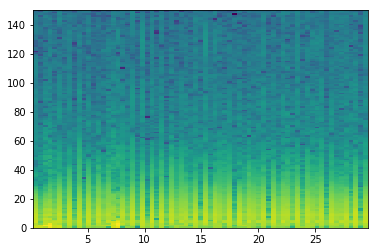

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8], [10, 11, 12, 13, 14, 15], [17, 18, 19, 20, 21, 22, 23]]
[0, 1, 2, 3, 4, 5, 6, 7, 8]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8]
theMin
0
theMax
900


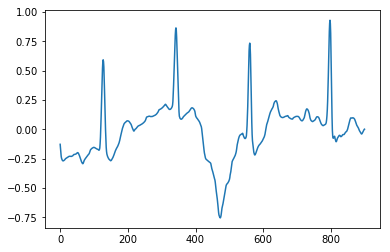

A00002
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


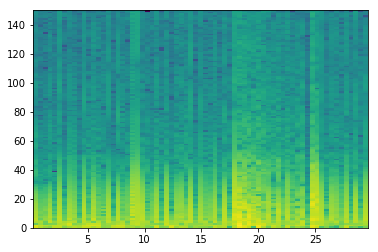

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 48, 49, 50, 51, 52, 53, 54, 55, 56, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 8, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], [21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38], [40, 41, 42, 43, 44, 45, 46, 47]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
theMin
0
theMax
2400


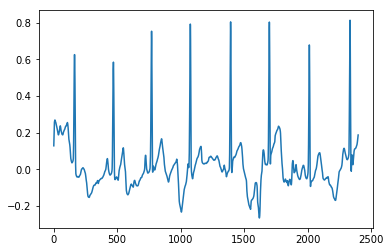

A00003
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

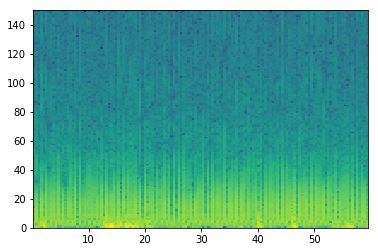

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

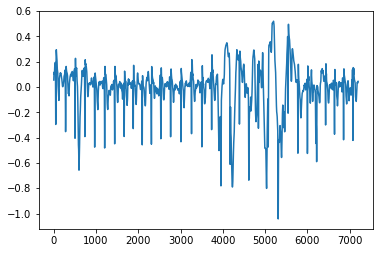

A00006
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


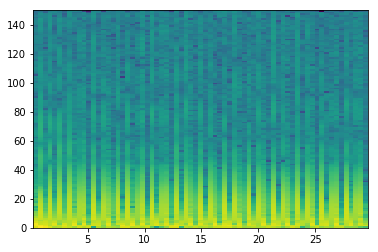

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

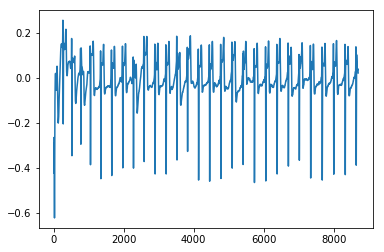

A00007
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


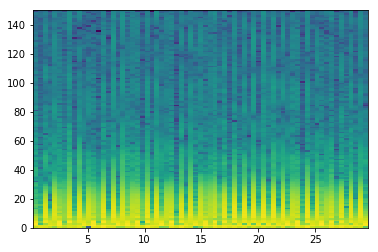

good List
[0, 1, 2, 3, 4, 5, 6, 8, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6], [], [9, 10, 11, 12, 13, 14, 15], [17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]]
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
longest
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
indexList
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 

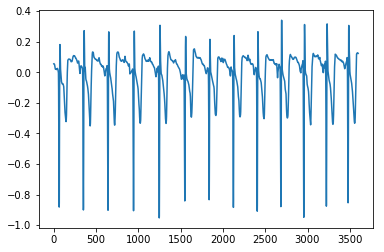

A00010
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

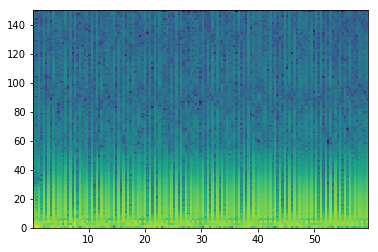

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

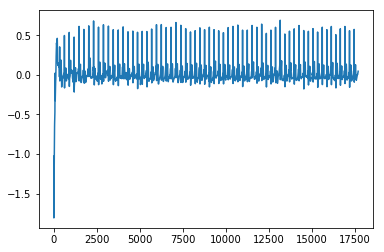

A00011
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


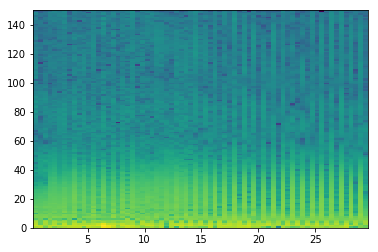

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

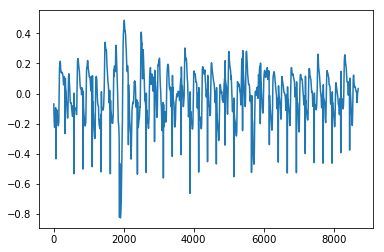

A00012
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


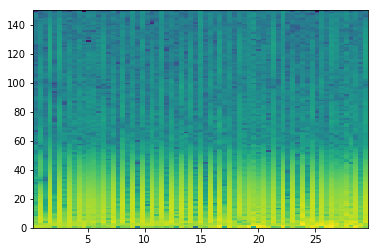

good List
[0, 1, 2, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2], [], [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15], [17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36]]
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
longest
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
indexList
[19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
theMin
2400
theMax
5100


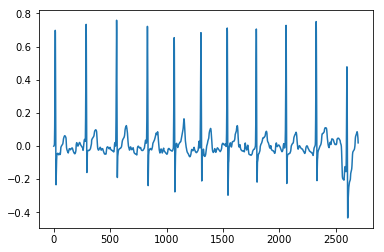

A00014
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92      ]


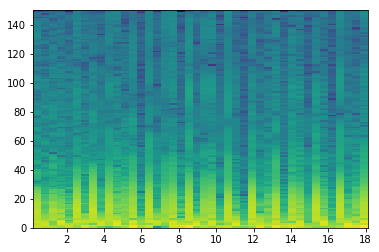

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 15, 16, 17, 18, 20, 21, 23, 25, 26, 27, 28, 29, 31, 34, 36, 37, 39, 40]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1, 2, 3, 2, 1, 2, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9], [11, 12], [14, 15, 16], [18], [], [21, 22, 23, 24], [], [], [28]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
theMin
0
theMax
1200


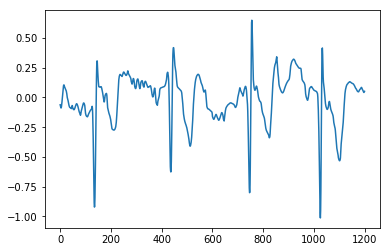

A00016
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


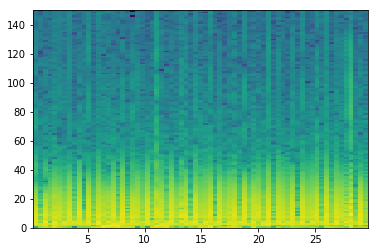

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 19, 21, 22, 23, 26, 27, 29, 30, 32, 34, 36, 37, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 51, 52, 53, 54, 56, 57, 59, 61, 63, 66, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 1, 3, 1, 2, 1, 2, 2, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 2, 2, 2, 3, 2]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [14, 15, 16], [], [19, 20], [22], [24], [], [], [28], [30, 31, 32, 33, 34, 35, 36, 37, 38, 39], [41, 42, 43], [45], [], [], [], []]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
theMin
0
theMax
1500


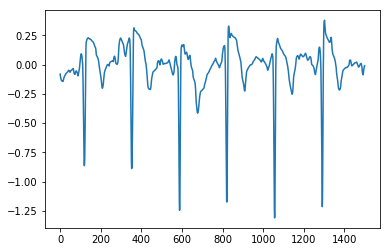

A00018
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


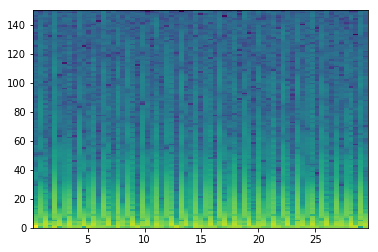

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

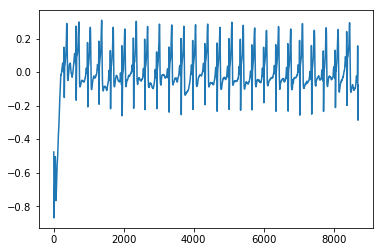

A00019
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

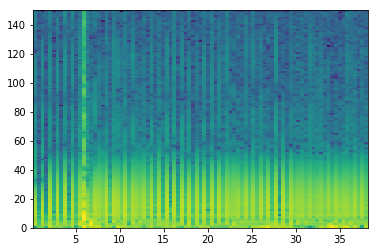

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]]
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]
longest
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]
indexList
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]
theMin
1800
theM

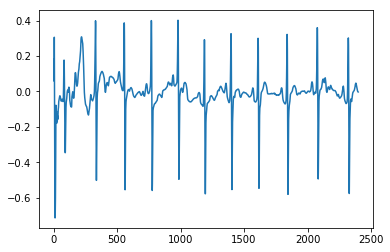

A00021
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


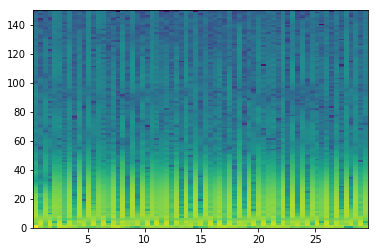

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]
indexList
[0, 1, 2, 3, 4, 5, 6

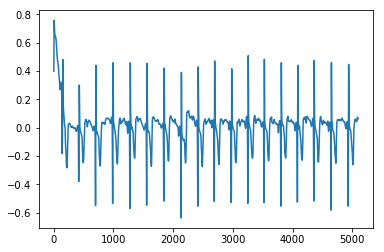

A00025
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


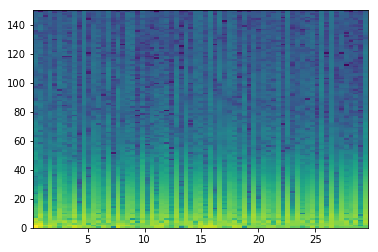

good List
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 28, 30, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 67]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20], [22, 23, 24], [], [], [28, 29, 30], [32, 33, 34], [36, 37, 38, 39, 40, 41, 42], [44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
longest
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
indexList
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
theMin
0
theMax
2700


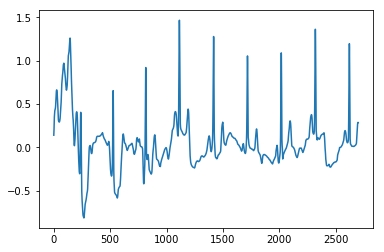

A00026
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


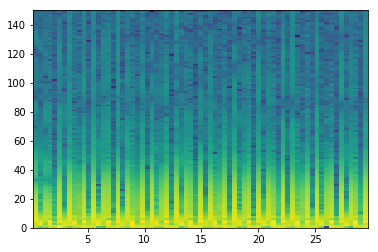

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 55, 56, 57, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37], [], [40, 41, 42, 43, 44, 45, 46, 47], [49, 50, 51, 52, 53]]
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
longest
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
indexList
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
theMin
15

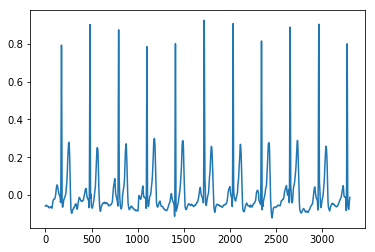

A00028
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

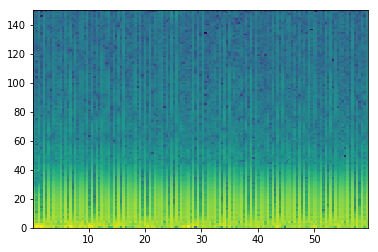

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the

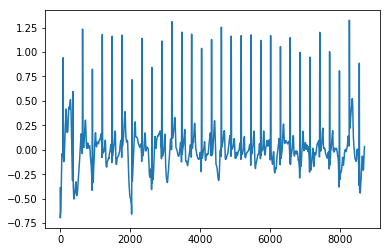

A00031
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


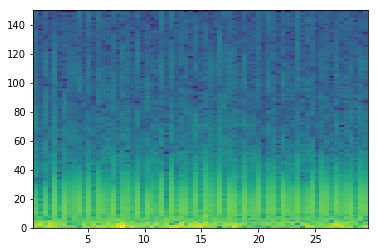

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

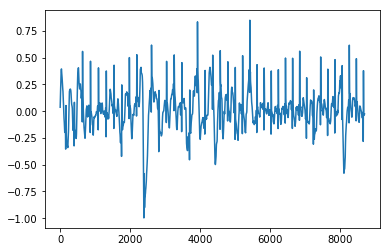

A00032
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16      ]


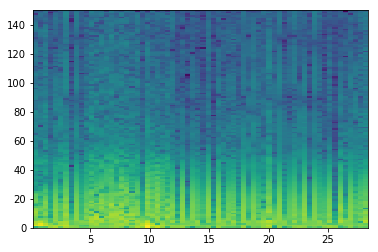

good List
[1, 2, 3, 4, 7, 8, 9, 21, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 47, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 63, 64, 65]
[1, 1, 1, 3, 1, 1, 12, 6, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1]
the temp 3
[[1, 2, 3], [5, 6], [], [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26], [28, 29, 30, 31, 32], [34, 35, 36, 37, 38]]
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
longest
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
indexList
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
theMin
3300
theMax
5700


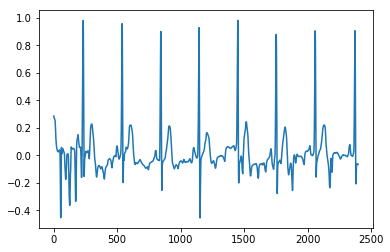

A00033
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


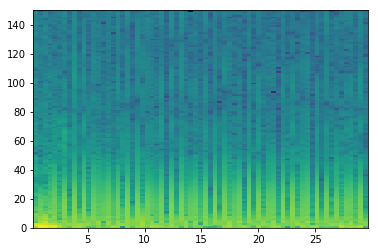

good List
[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5]]
[0, 1, 2, 3, 4, 5]
longest
[0, 1, 2, 3, 4, 5]
indexList
[0, 1, 2, 3, 4, 5]
theMin
0
theMax
600


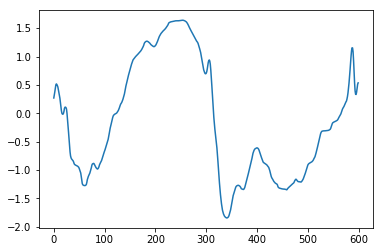

A00035
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


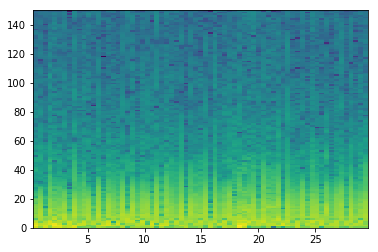

good List
[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 36, 38, 39, 40, 41, 42, 43, 45, 46, 49, 51, 52, 53, 54, 55, 56, 59, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 1, 3, 2, 1, 1, 1, 1, 1, 3, 2, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7], [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33], [], [36, 37, 38, 39, 40], [42], [], [45, 46, 47, 48, 49], []]
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34]
longest
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34]
indexList
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34]
theMin
1200
theMax
4200


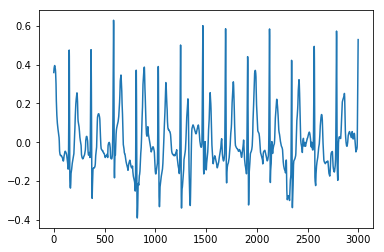

A00036
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


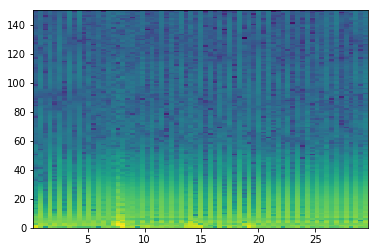

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

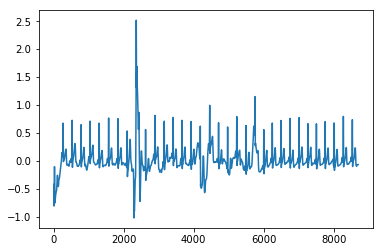

A00037
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

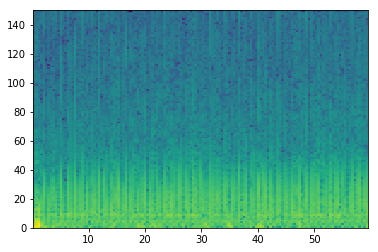

good List
[0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 50, 51, 52, 53, 54, 55, 57, 58, 59, 60, 62, 63, 64, 65, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 137, 138]
[2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 5, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1]
the temp 3
[[], [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15], [17], [19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30], [32, 33, 3

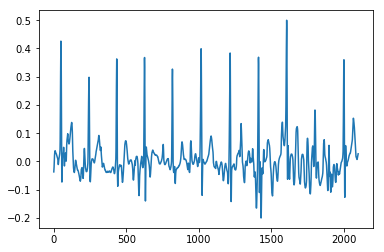

A00039
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


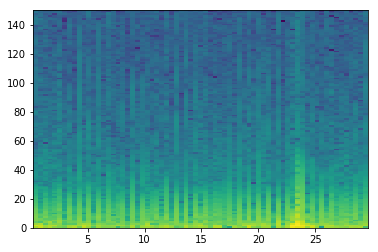

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 2

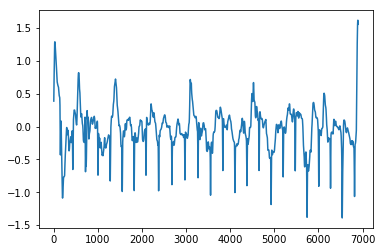

A00040
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


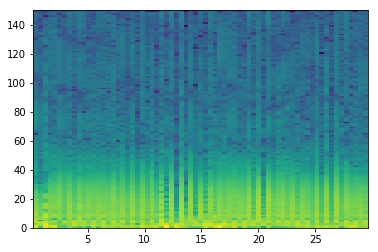

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

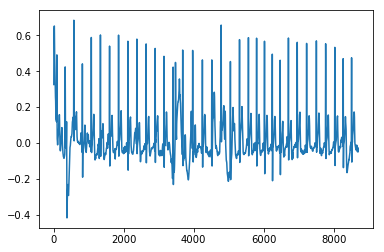

A00042
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


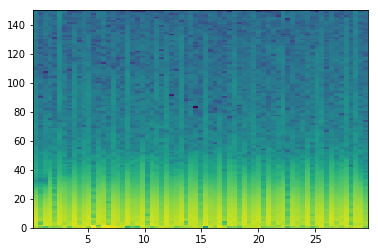

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 1

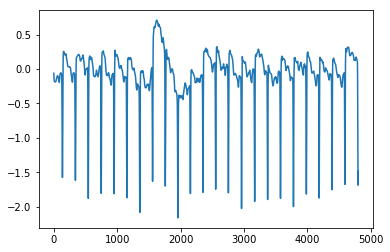

A00044
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


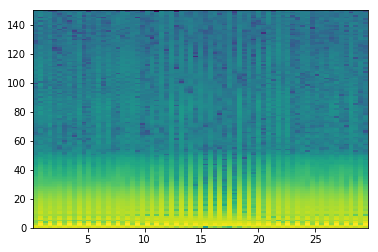

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

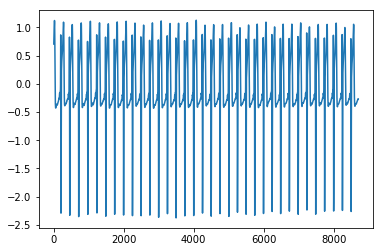

A00045
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


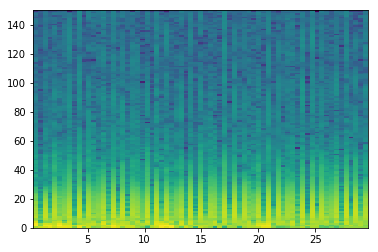

good List
[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3], [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21], [23, 24, 25, 26, 27, 28, 29, 30, 31], [33, 34, 35]]
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
longest
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
indexList
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
theMin
600
theMax
2700


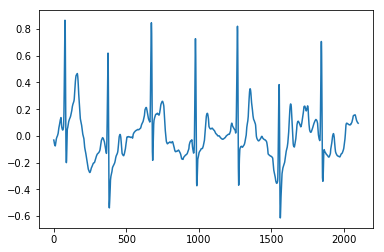

A00046
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


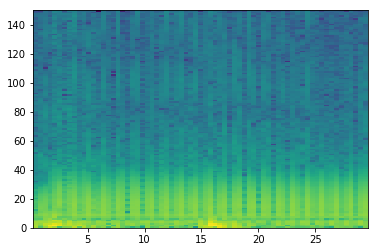

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10], [12], [14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33], [35, 36, 37]]
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35]
longest
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35]
indexList
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35]
theMin
1800
theMax
4500


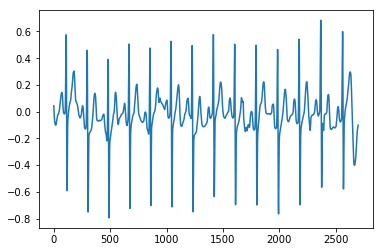

A00048
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


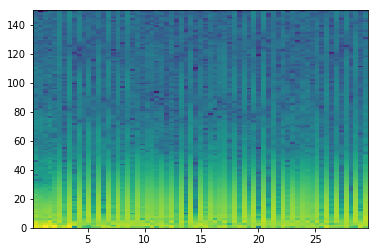

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

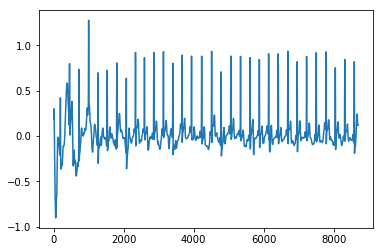

A00049
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


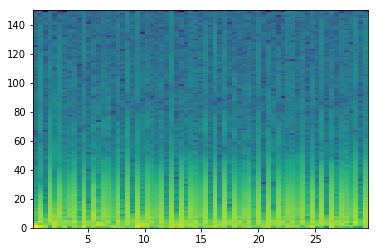

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

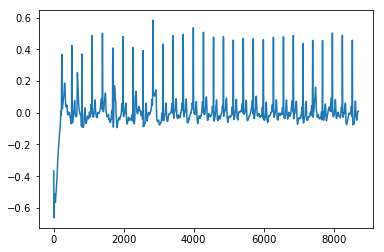

A00050
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


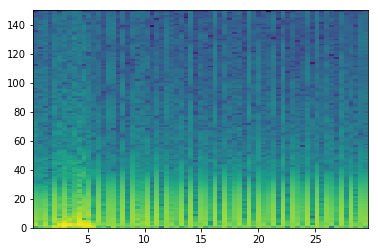

good List
[0, 1, 2, 3, 7, 12, 13, 14, 15, 16, 17, 19, 22, 23, 24, 26, 27, 28, 29, 30, 31, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 47, 48, 49, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68]
[1, 1, 1, 4, 5, 1, 1, 1, 1, 1, 2, 3, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1]
the temp 3
[[1, 2, 3], [], [6, 7, 8, 9, 10], [], [13, 14], [16, 17, 18, 19, 20], [22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33], [35, 36, 37], [39, 40, 41, 42, 43, 44, 45, 46, 47, 48]]
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
longest
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
indexList
[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
theMin
4200
theMax
5700


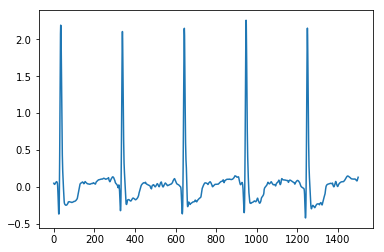

A00051
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

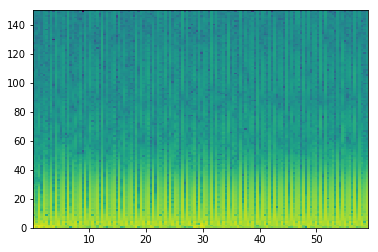

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 67, 68, 69, 71, 72, 74, 76, 77, 78, 79, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [], [14, 15, 16, 17

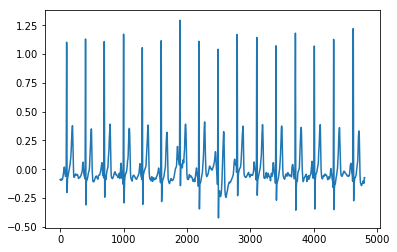

A00052
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333]


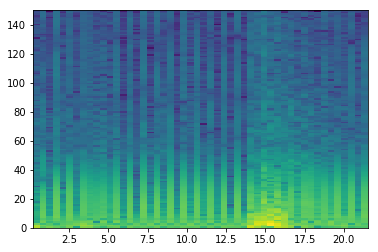

good List
[0, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 31, 42, 43, 44, 45, 46, 47, 48, 49]
[2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 11, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[], [], [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13], [15, 16], [18, 19], [21, 22, 23, 24], []]
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
longest
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
indexList
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
theMin
600
theMax
1800


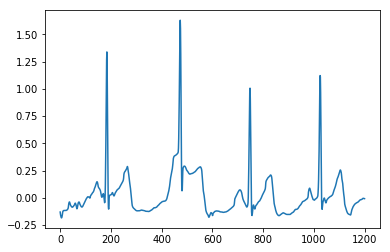

A00053
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


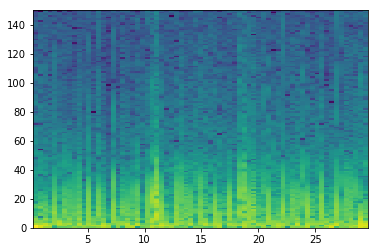

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23], [25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39], [], [42, 43, 44, 45, 46, 47, 48, 49]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
theMin
0
theMax
3000


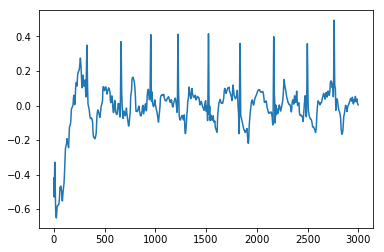

A00057
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333]


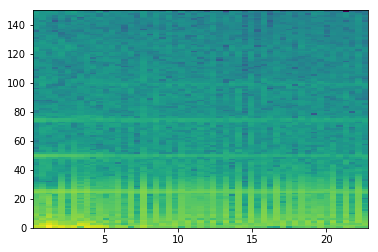

good List
[]
[]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


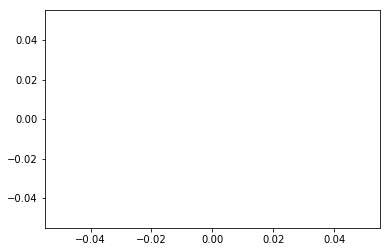

A00059
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

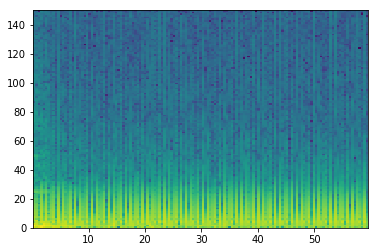

good List
[2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the tem

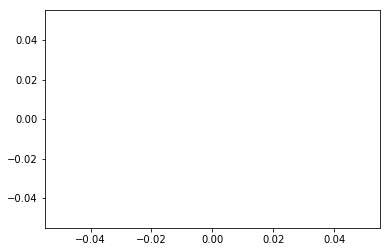

A00060
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

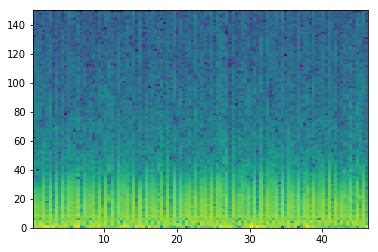

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 

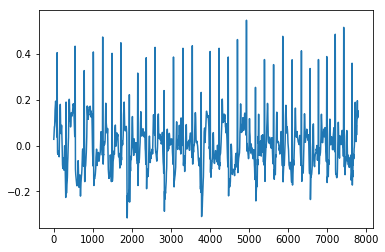

A00062
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


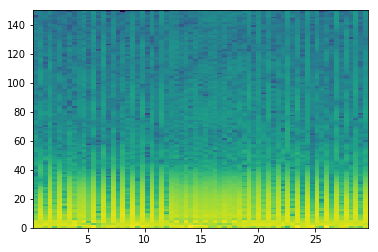

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13], [15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]]
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
longest
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]

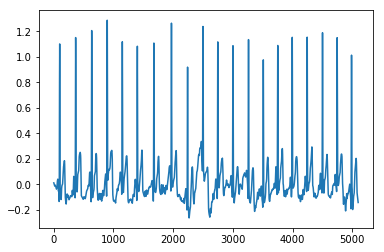

A00063
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

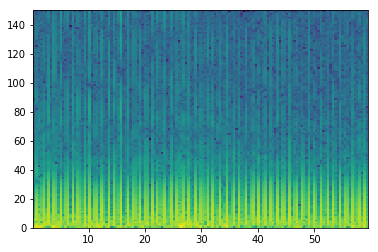

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

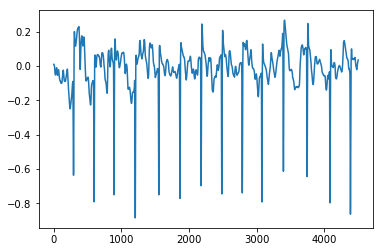

A00064
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


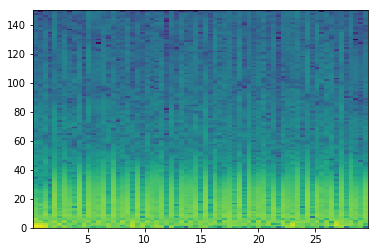

good List
[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 57, 58, 59, 60, 61, 62, 64, 66, 67, 68]
[1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1]
the temp 3
[[1, 2, 3], [5, 6, 7, 8, 9, 10, 11, 12, 13, 14], [16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34], [36, 37, 38], [], [41, 42, 43, 44, 45, 46, 47, 48, 49, 50], [52, 53, 54, 55, 56], []]
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36]
longest
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36]
indexList
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36]
theMin
2100
theMax
4500


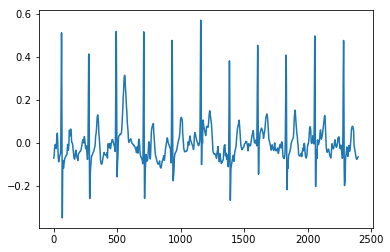

A00068
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

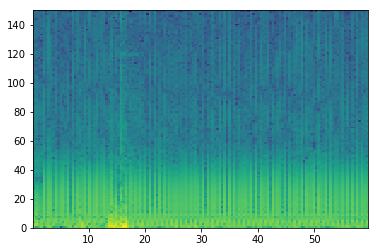

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2

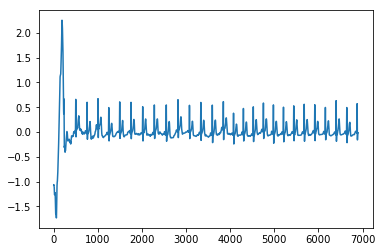

A00072
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


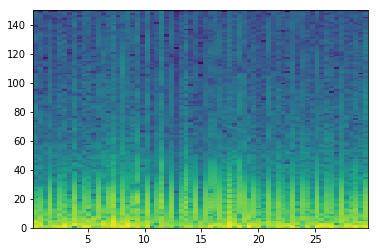

good List
[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 17, 20, 22, 23, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 39, 42, 44, 45, 46, 47, 48, 49, 51, 53, 54, 57, 58, 59, 61, 62, 64, 65, 66, 67]
[1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 4, 3, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 3, 2, 1, 1, 1, 1, 1, 2, 2, 1, 3, 1, 1, 2, 1, 2, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7], [9, 10, 11, 12], [], [], [16, 17, 18], [20, 21, 22], [24, 25, 26, 27, 28, 29, 30], [], [33, 34, 35, 36, 37], [], [40], [42, 43], [45]]
[0, 1, 2, 3, 4, 5, 6, 7]
longest
[0, 1, 2, 3, 4, 5, 6, 7]
indexList
[0, 1, 2, 3, 4, 5, 6, 7]
theMin
0
theMax
900


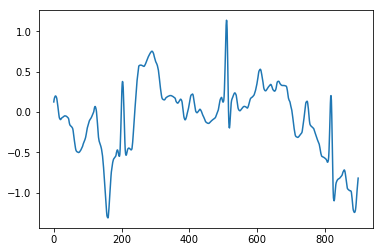

A00073
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


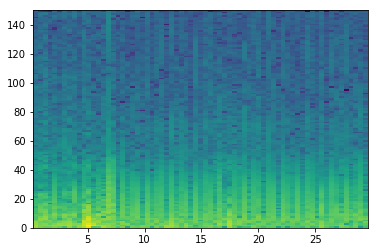

good List
[3, 5, 8, 9, 12, 13, 14, 17, 19, 20, 21, 22, 23, 24, 25, 27, 29, 31, 32, 33, 34, 35, 36, 37, 39, 40, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 68]
[2, 3, 1, 3, 1, 1, 3, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2]
the temp 3
[[], [], [3], [5, 6], [], [9, 10, 11, 12, 13, 14], [], [], [18, 19, 20, 21, 22, 23], [25], [27, 28, 29, 30, 31], [33], [35, 36, 37, 38, 39, 40], [42, 43, 44, 45, 46, 47]]
[19, 20, 21, 22, 23, 24, 25]
longest
[19, 20, 21, 22, 23, 24, 25]
indexList
[19, 20, 21, 22, 23, 24, 25]
theMin
2400
theMax
3300


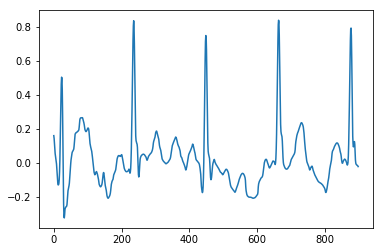

A00076
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


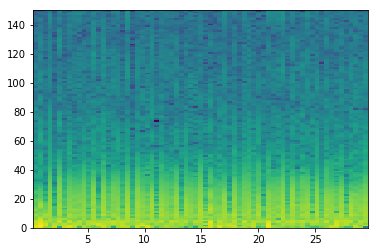

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

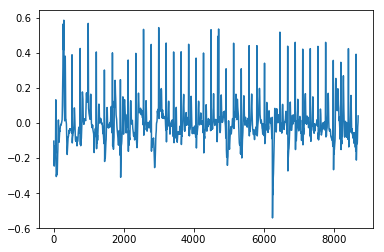

A00079
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


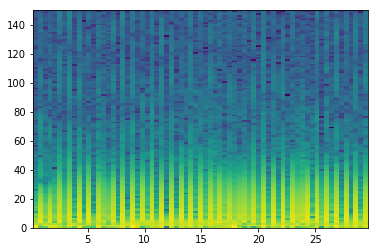

good List
[0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6], [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22], [24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]]
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
longest
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
indexList
[25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41,

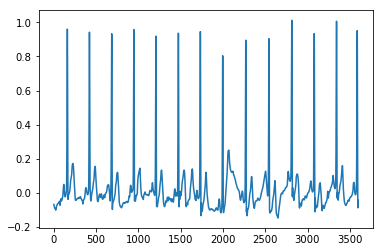

A00080
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


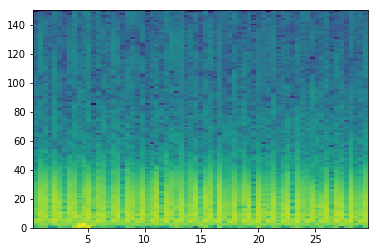

good List
[0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 15, 18, 19, 20, 21, 23, 24, 25, 26, 28, 29, 31, 33, 34, 35, 36, 37, 39, 40, 42, 44, 45, 46, 47, 48, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 66, 67, 68]
[1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 1, 1, 1, 2, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1]
the temp 3
[[1], [3, 4, 5, 6, 7, 8, 9, 10, 11], [], [14, 15, 16], [18, 19, 20], [22], [], [25, 26, 27, 28], [30], [], [33, 34, 35, 36], [38, 39, 40], [42, 43, 44, 45, 46, 47, 48, 49, 50]]
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
longest
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
indexList
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
theMin
300
theMax
1500


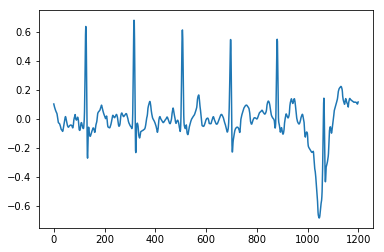

A00081
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

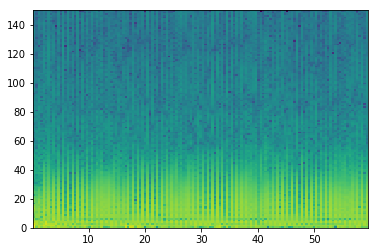

good List
[1, 2, 3, 4, 5, 7, 8, 9, 11, 13, 15, 17, 18, 19, 20, 21, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 71, 73, 75, 77, 79, 80, 81, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103, 104, 106, 107, 108, 109, 110, 112, 114, 115, 116, 117, 118, 120, 122, 123, 124, 126, 127, 128, 129, 130, 132, 133, 134, 135, 137, 138]
[1, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1]
the temp 3
[[1, 2, 3, 4], [6, 7], [], [], [], [12, 13, 14, 15], [], [18, 19, 20, 21, 22, 23, 24, 25, 26, 27], [29, 30, 31, 32, 33], [35, 36, 37, 38, 39, 40], [42, 43], [45, 46, 47, 48, 49, 50, 51, 5

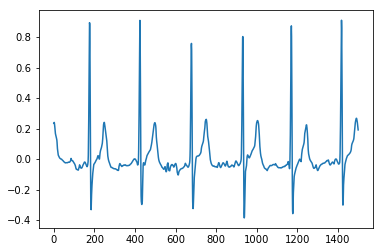

A00084
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


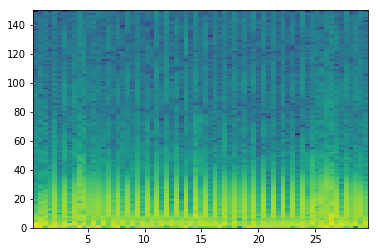

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
theMin
0
theMax
1200


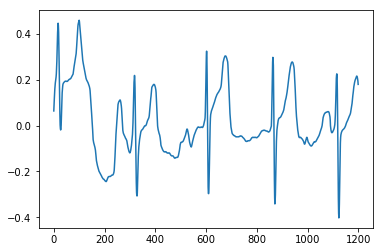

A00085
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


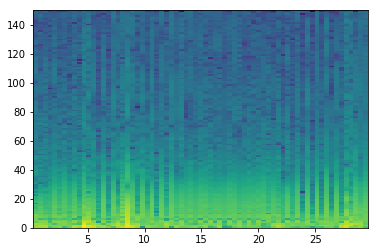

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 13, 15, 17, 20, 21, 23, 25, 26, 27, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 57, 58, 59, 60, 61, 62, 63, 65, 67]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 3, 1, 2, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 2]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9], [], [], [], [], [15], [], [18, 19], [], [22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45], [47, 48, 49, 50, 51, 52], []]
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
longest
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
indexList
[31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
theMin
3900
theMax
6900


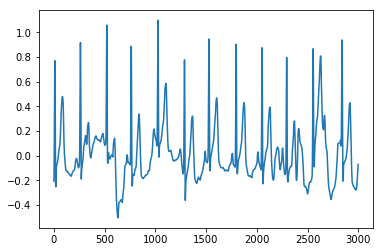

A00086
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


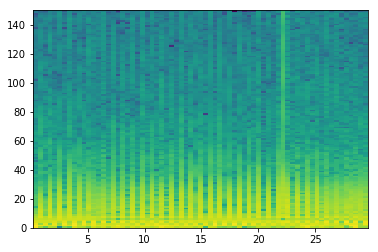

good List
[0, 2, 3, 4, 6, 8, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 31, 32, 33, 34, 35, 37, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 52, 53, 54, 55, 56, 57, 59, 61, 62, 63, 64, 65, 66, 67, 68]
[2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[], [2, 3], [], [6, 7, 8, 9, 10, 11, 12], [14, 15, 16, 17, 18, 19, 20, 21, 22, 23], [], [26, 27, 28, 29], [], [32, 33, 34, 35, 36, 37, 38, 39, 40, 41], [43, 44, 45, 46, 47], []]
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
longest
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
indexList
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
theMin
2100
theMax
3300


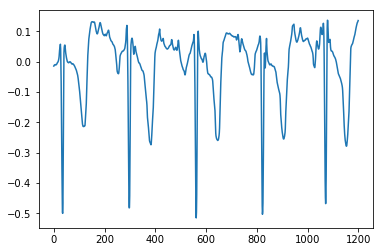

A00089
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


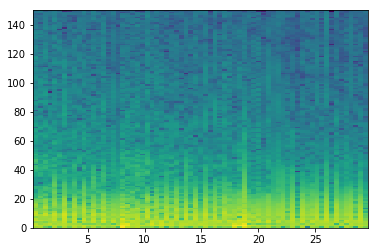

good List
[7, 9, 12, 13, 15, 17, 24, 25, 26, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 40, 41, 44, 45, 46, 47, 48, 49, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 68]
[2, 3, 1, 2, 2, 7, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 3, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1]
the temp 3
[[], [], [3], [], [], [7, 8], [10, 11], [13, 14, 15, 16, 17, 18], [20], [22, 23, 24, 25, 26], [28, 29, 30, 31, 32, 33, 34, 35, 36, 37]]
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
longest
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
indexList
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
theMin
6600
theMax
7800


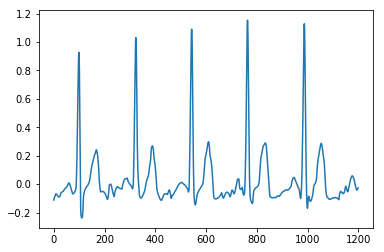

A00091
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


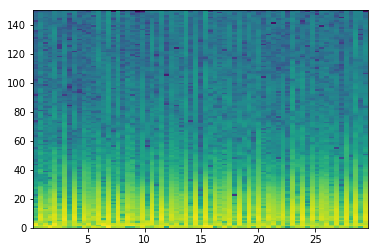

good List
[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 65, 66, 67, 68]
[1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1]
the temp 3
[[1, 2, 3], [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24], [26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50], [52, 53, 54, 55, 56, 57, 58, 59, 60]]
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
longest
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
indexList
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 

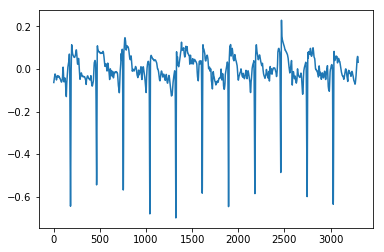

A00093
[ 0.42666667  0.85333333  1.28        1.70666667  2.13333333
  2.56        2.98666667  3.41333333  3.84        4.26666667
  4.69333333  5.12        5.54666667  5.97333333  6.4         6.82666667
  7.25333333  7.68        8.10666667  8.53333333  8.96
  9.38666667]


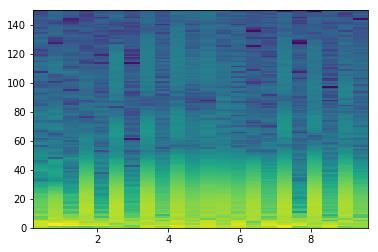

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
theMin
0
theMax
2100


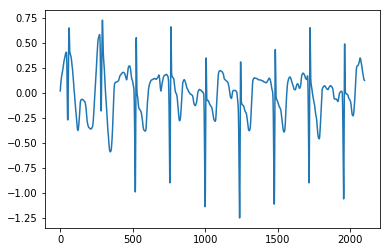

A00094
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


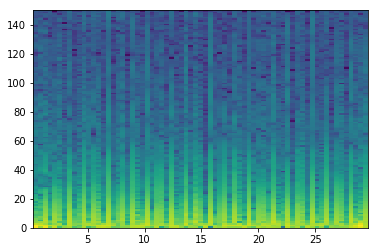

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 13, 14, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 45, 46, 47, 48, 50, 51, 52, 53, 55, 56, 58, 59, 61, 62, 63, 64, 66, 67]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 2, 1, 2, 1, 1, 1, 2, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9], [], [12], [14, 15, 16], [18, 19, 20, 21, 22, 23], [25], [27, 28, 29], [31, 32, 33], [35], [37, 38, 39], [41, 42, 43], [45], [47], [49, 50, 51]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
theMin
0
theMax
1200


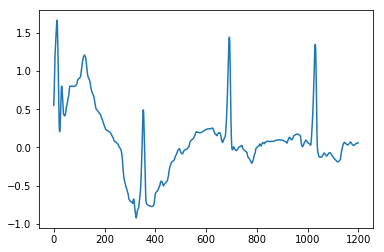

A00095
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


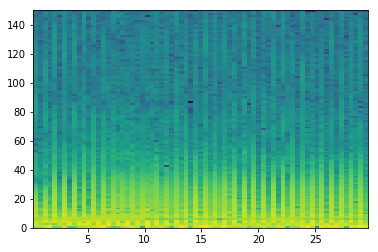

good List
[0, 1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3], [5, 6, 7, 8], [], [11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25], [], [28, 29, 30, 31, 32, 33, 34, 35, 36, 37]]
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
longest
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
indexList
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
theMin
1500
theMax
3600


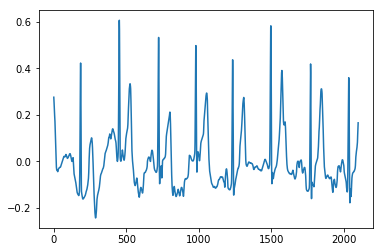

A00097
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


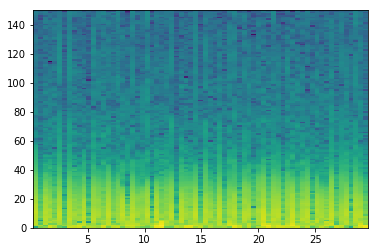

good List
[1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 65, 66, 67, 68]
[1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1]
the temp 3
[[1, 2, 3], [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]]
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]
longest
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,

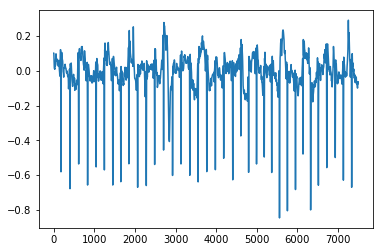

A00098
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


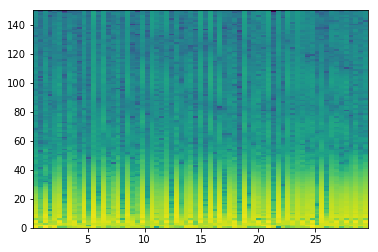

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

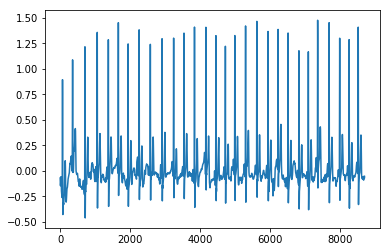

A00099
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


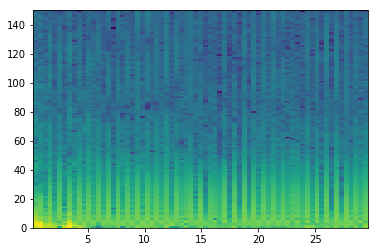

good List
[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2], [4, 5, 6, 7, 8, 9], [11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24], [26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]]
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26]
longest
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26]
indexList
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26]
theMin
1500
theMax
3300


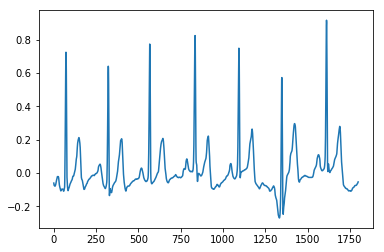

A00104
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


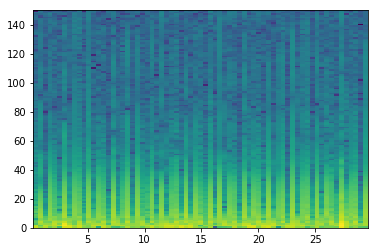

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

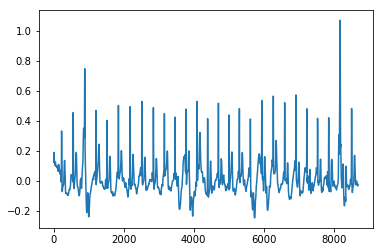

A00105
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

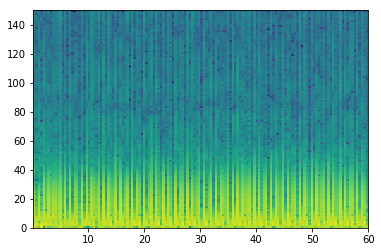

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 65, 66, 67, 68, 70, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 93, 95, 96, 97, 98, 100, 102, 103, 105, 106, 107, 108, 110, 112, 113, 114, 115, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 129, 130, 131, 132, 133, 134, 135, 136, 138, 139]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 2, 1, 2, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10], [12, 13, 14, 15, 16, 17, 18, 19, 20], [22, 23, 24, 25, 26, 27, 28, 29, 30, 31], [33

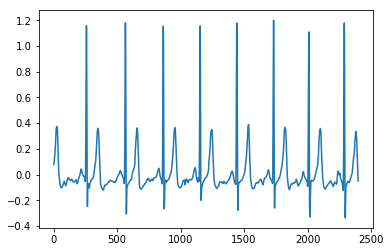

A00109
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


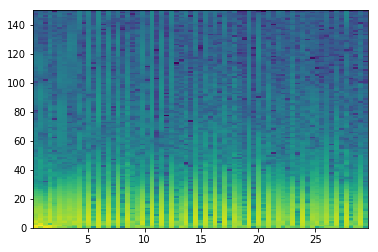

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18], [20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]]
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
longest
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
indexList
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
theMin
2400
theMax
5100


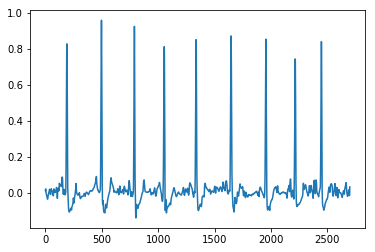

A00111
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


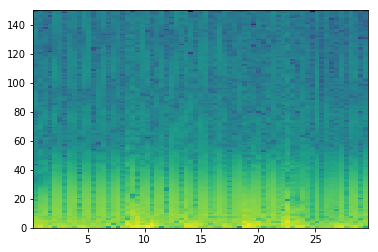

good List
[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 30, 31, 32, 33, 34, 36, 37, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 3, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3], [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17], [19, 20], [22, 23, 24], [26, 27, 28, 29], [31], [33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]]
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
longest
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
indexList
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
theMin
600
theMax
2400


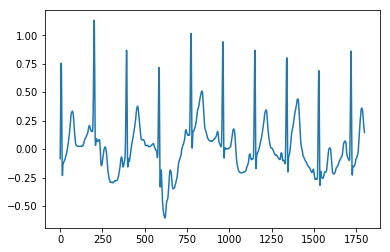

A00112
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


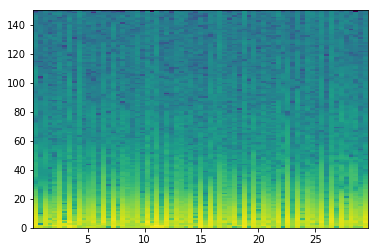

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43

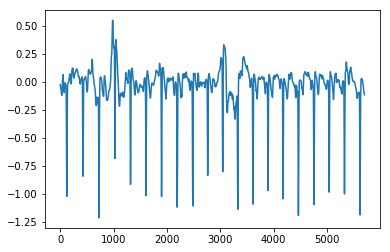

A00113
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


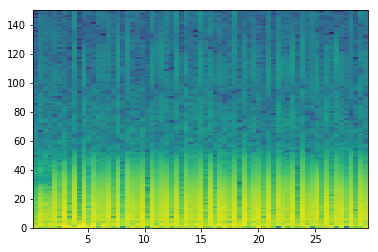

good List
[0, 1, 4, 5, 6, 7, 9, 11, 15, 16, 17, 18, 23, 25, 28, 37, 42, 44, 47, 49, 52, 54, 56, 57, 58, 59, 61, 64, 66, 68]
[1, 3, 1, 1, 1, 2, 2, 4, 1, 1, 1, 5, 2, 3, 9, 5, 2, 3, 2, 3, 2, 2, 1, 1, 1, 2, 3, 2, 2]
the temp 3
[[1], [3, 4, 5], [], [], [9, 10, 11], [], [], [], [], [], [], [], [], [], [], [23, 24, 25], [], [], []]
[4, 5, 6, 7]
longest
[4, 5, 6, 7]
indexList
[4, 5, 6, 7]
theMin
600
theMax
900


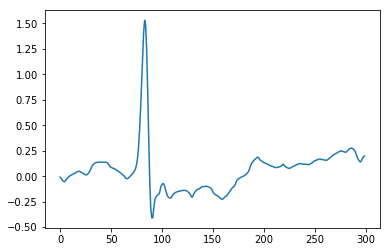

A00116
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


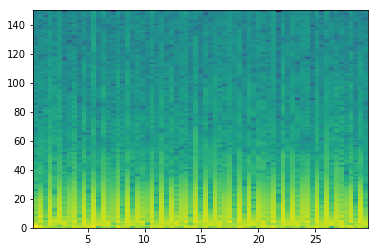

good List
[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 55, 56, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2], [4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31], [33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48], [50, 51, 52, 53, 54, 55, 56]]
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]
longest
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]
indexList
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25

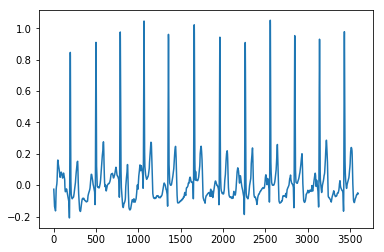

A00117
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


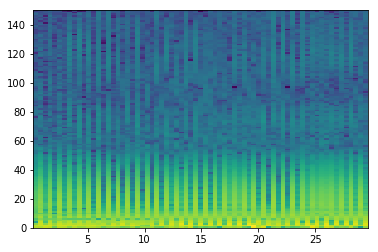

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

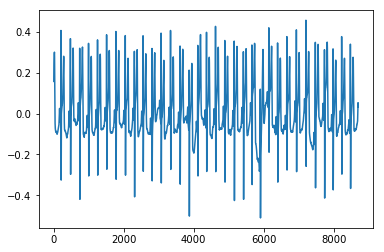

A00118
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


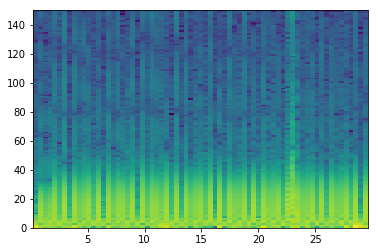

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 

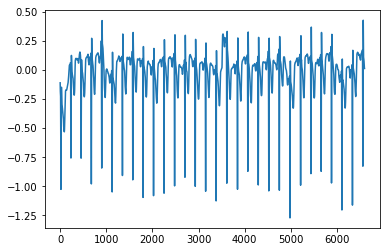

A00122
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


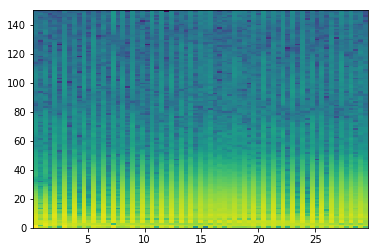

good List
[0, 1, 3, 5, 7, 9, 11, 13, 15, 17, 18, 19, 21, 23, 24, 25, 26, 27, 29, 31, 32, 33, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 50, 52, 54, 55, 56, 57, 58, 60, 62, 63, 64, 66, 67, 68]
[1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 1]
the temp 3
[[1], [], [], [], [], [], [], [], [10, 11], [], [14, 15, 16, 17], [], [20, 21], [], [24, 25, 26, 27, 28, 29, 30, 31, 32], [], [], [], [37, 38, 39, 40], [], [43, 44]]
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
longest
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
indexList
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
theMin
4800
theMax
6000


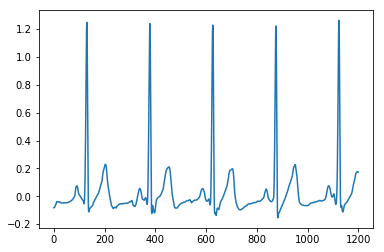

A00124
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


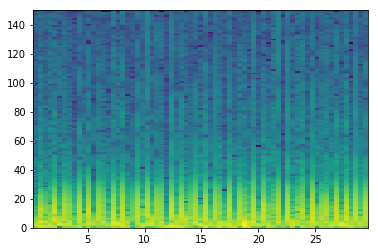

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

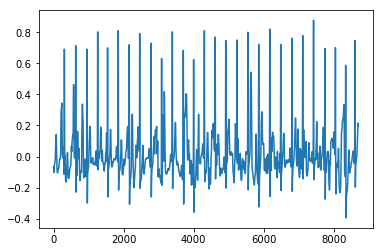

A00127
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


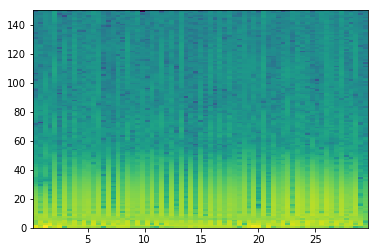

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42], [44, 45, 46, 47, 48, 49, 50], [52, 53, 54, 55, 56, 57]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 

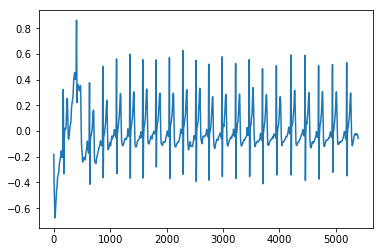

A00129
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


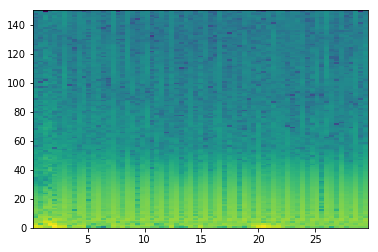

good List
[0, 1, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68]
[1, 3, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1]
the temp 3
[[1], [], [4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42], [44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]]
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
longest
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 4

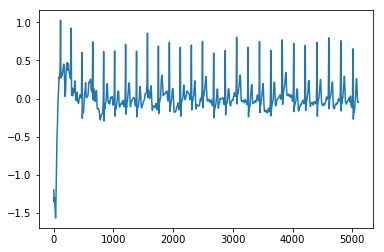

A00130
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


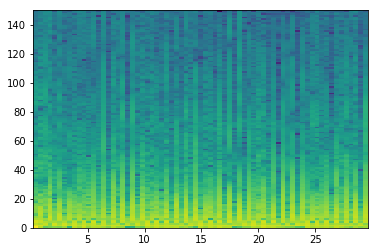

good List
[0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 17, 19, 21, 23, 24, 25, 26, 27, 28, 30, 32, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 48, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 65, 66, 67]
[2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 3, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1]
the temp 3
[[], [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [], [], [], [], [18, 19, 20, 21, 22], [], [], [26, 27, 28, 29, 30], [32, 33, 34, 35], [], [], [39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]]
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
longest
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
indexList
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
theMin
300
theMax
1500


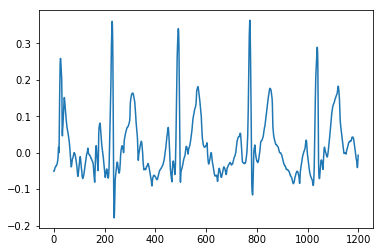

A00134
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


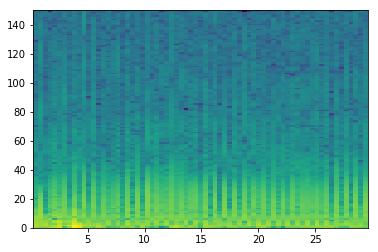

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

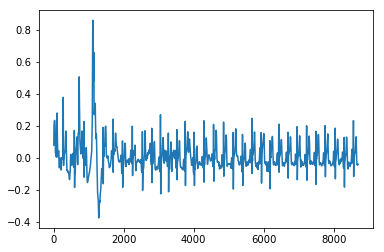

A00135
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

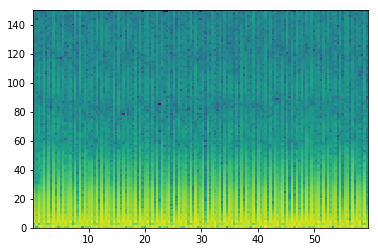

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

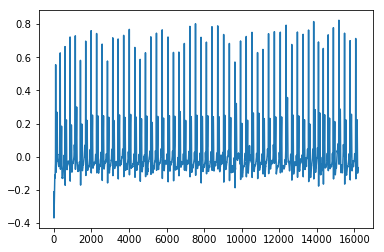

A00140
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


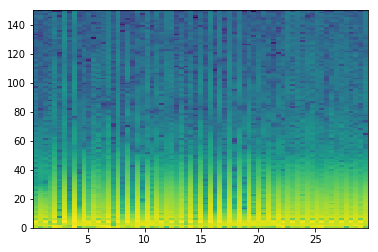

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16], []]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
theMin
0
theMax
2100


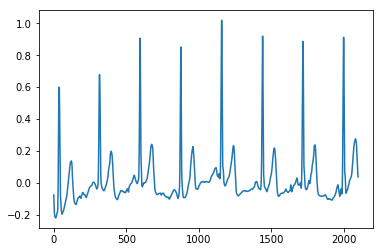

A00142
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


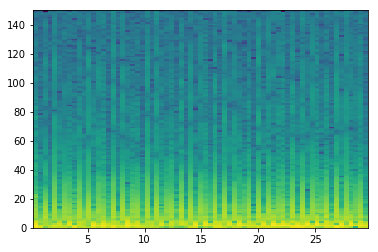

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22], [24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]]
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
longest
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
indexList
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 

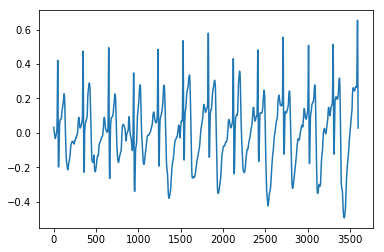

A00143
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

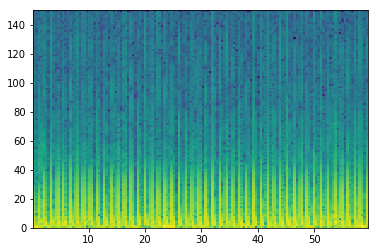

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 117, 118, 119, 120, 121, 122, 123, 124, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[

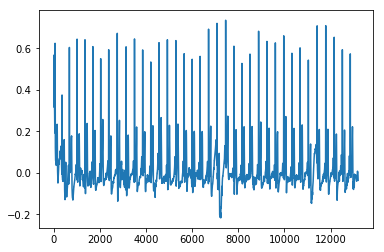

A00144
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


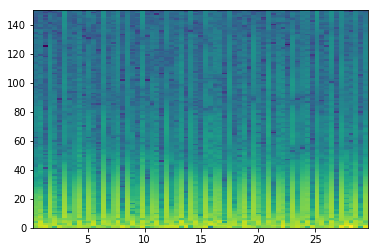

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
theMin
0
theMax
2700


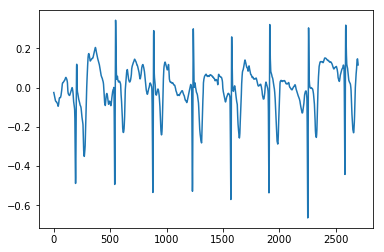

A00146
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


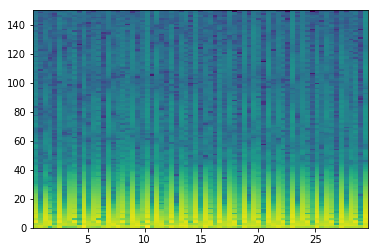

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

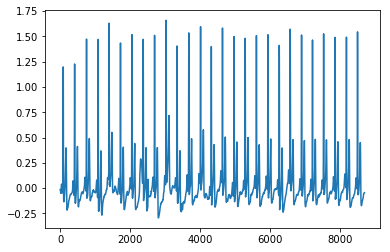

A00147
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

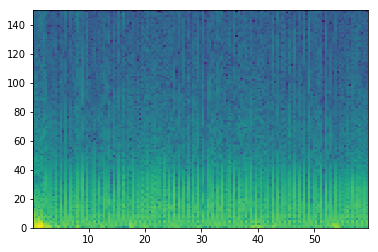

good List
[0, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 32, 34, 35, 36, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 75, 76, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[6, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[], [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 2

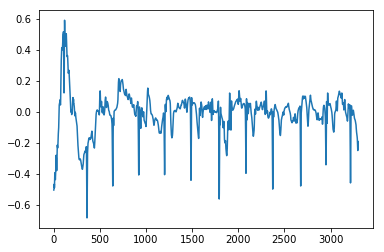

A00148
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


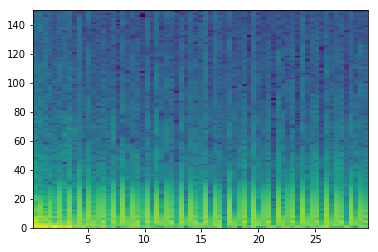

good List
[1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5], [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]]
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
longest
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,

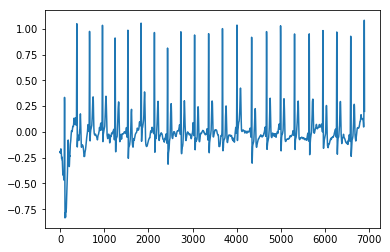

A00149
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


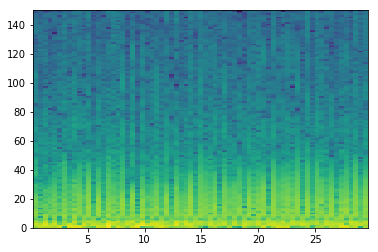

good List
[1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 19, 21, 22, 23, 24, 25, 26, 28, 30, 31, 32, 33, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 57, 58, 59, 60, 61, 62, 64, 65, 67, 68]
[1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 5, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 1, 2, 1]
the temp 3
[[1, 2, 3, 4], [6, 7, 8, 9, 10, 11, 12], [], [15, 16, 17, 18, 19], [], [22, 23, 24], [26, 27, 28], [30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42], [], [45, 46, 47, 48, 49], [51]]
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
longest
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
indexList
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
theMin
5100
theMax
6900


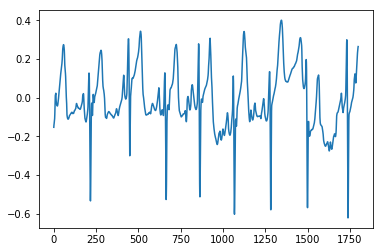

A00150
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


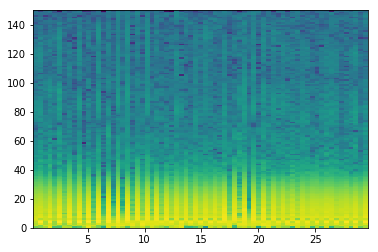

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

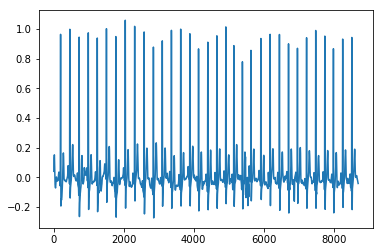

A00151
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


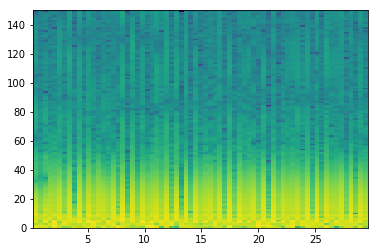

good List
[0, 1, 2, 3, 4, 5, 6, 8, 10, 12, 13, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 28, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 43, 44, 45, 46, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6], [], [], [10, 11, 12, 13, 14], [], [17, 18, 19, 20, 21], [], [24, 25, 26, 27, 28, 29, 30, 31, 32], [], [35, 36, 37, 38, 39], [41, 42, 43, 44, 45, 46, 47, 48, 49]]
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
longest
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
indexList
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
theMin
3900
theMax
5100


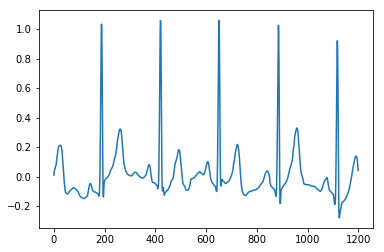

A00152
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


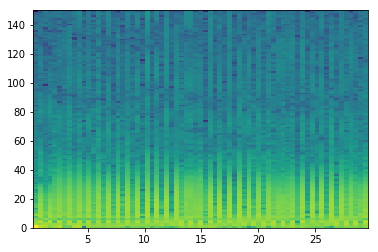

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
theMin
0
theMax
2700


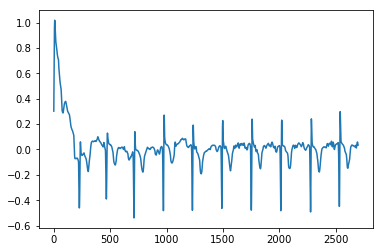

A00153
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


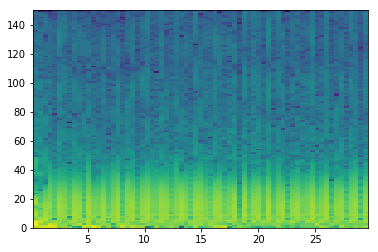

good List
[1, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68]
[2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1]
the temp 3
[[], [2, 3, 4, 5, 6], [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29], [31, 32, 33, 34, 35, 36], [38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]]
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]
longest
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]
indexList
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]
theMin
1200
theMax
4200


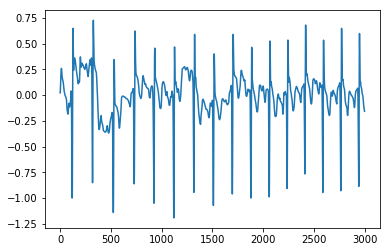

A00154
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


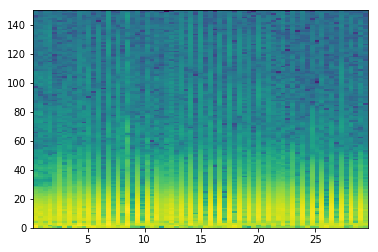

good List
[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 12, 14, 16, 17, 18, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 36, 37, 39, 40, 41, 43, 45, 47, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 68]
[1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2]
the temp 3
[[1, 2, 3, 4], [6, 7, 8, 9], [], [], [13, 14], [16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26], [], [29, 30], [32, 33], [], [], [37, 38, 39, 40, 41], [43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]]
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
longest
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
indexList
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
theMin
6900
theMax
8400


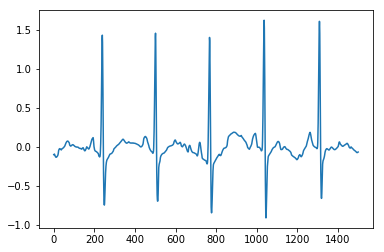

A00157
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

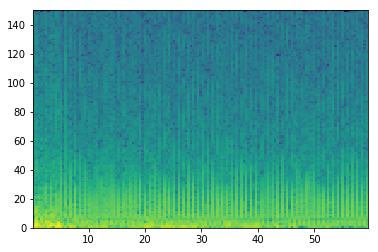

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

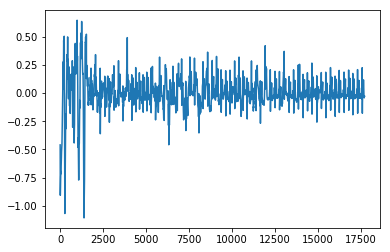

A00160
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


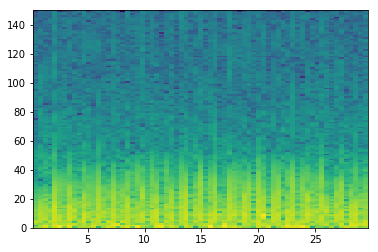

good List
[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3], [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]]
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
longest
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
indexList
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 2

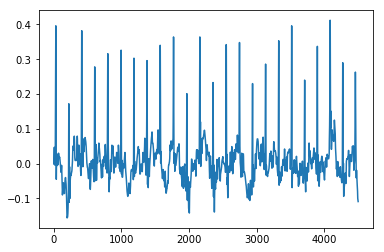

A00163
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


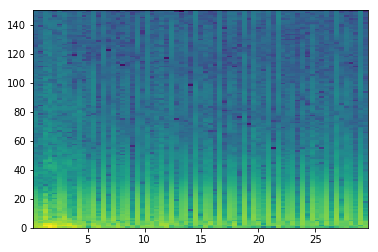

good List
[0, 1, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 68]
[1, 3, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1]
the temp 3
[[1], [3], [5], [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]]
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
longest
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 3

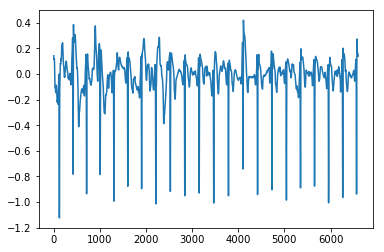

A00165
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


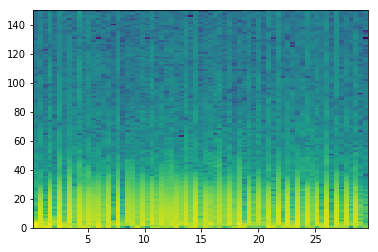

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

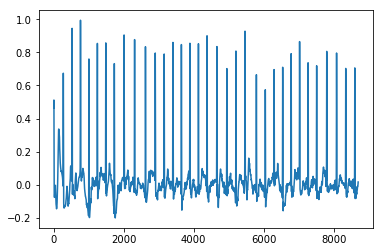

A00166
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


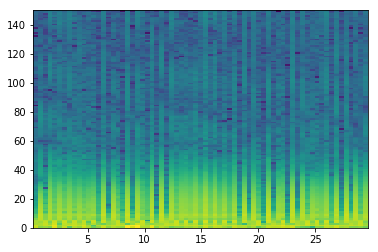

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

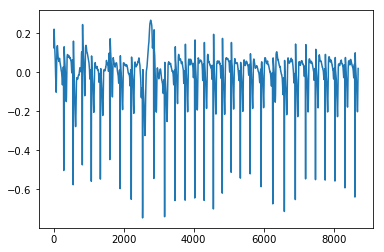

A00167
[ 0.42666667  0.85333333  1.28        1.70666667  2.13333333
  2.56        2.98666667  3.41333333  3.84        4.26666667
  4.69333333  5.12        5.54666667  5.97333333  6.4         6.82666667
  7.25333333  7.68        8.10666667  8.53333333  8.96
  9.38666667]


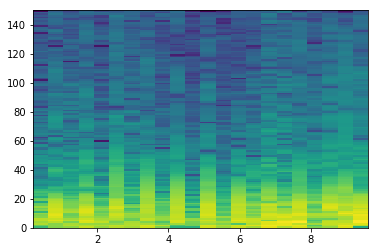

good List
[0, 1, 4, 6, 7, 8, 10, 11, 12, 13, 14, 18]
[1, 3, 2, 1, 1, 2, 1, 1, 1, 1, 4]
the temp 3
[[1], [], [4, 5], [7, 8, 9, 10]]
[10, 11, 12, 13, 14]
longest
[10, 11, 12, 13, 14]
indexList
[10, 11, 12, 13, 14]
theMin
1200
theMax
1800


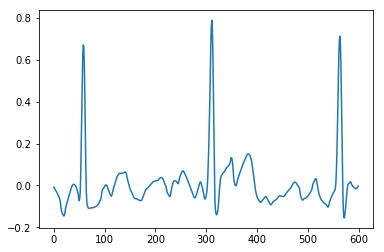

A00168
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


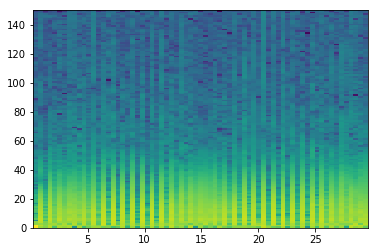

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 55, 56, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], [21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41], [43, 44, 45, 46, 47, 48], [50, 51, 52, 53]]
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
longest
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
indexList
[21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
theMin
2700
theMax
5400


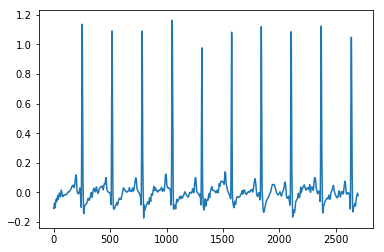

A00169
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


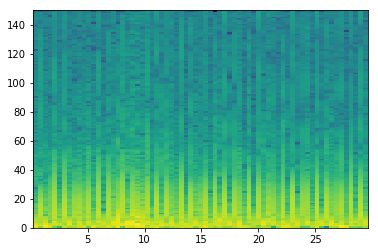

good List
[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 19, 20, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 3, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3], [5, 6, 7, 8, 9], [11, 12, 13, 14], [16], [], [19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]]
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
longest
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
indexList
[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
theMin
3000
theMax
6300


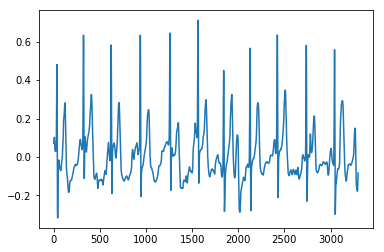

A00171
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


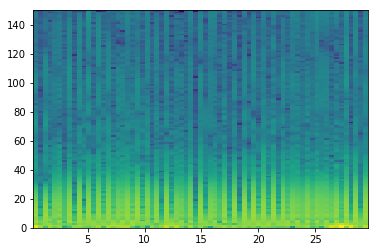

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39

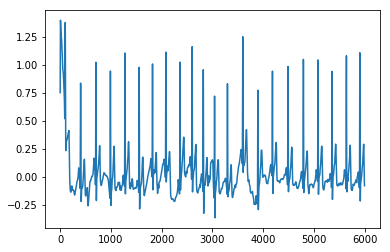

A00172
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


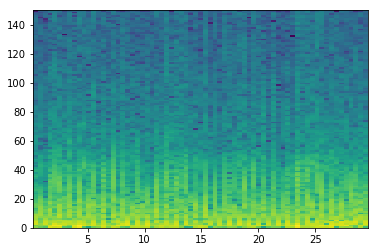

good List
[0, 1, 2, 6, 8, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 59, 60, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 4, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 2, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2], [], [5, 6, 7, 8, 9, 10, 11], [13, 14, 15, 16, 17, 18, 19, 20, 21], [23], [25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48], [50]]
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
longest
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
indexList
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
theMin
4200
theMax
7200


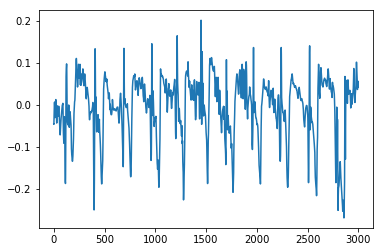

A00173
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333]


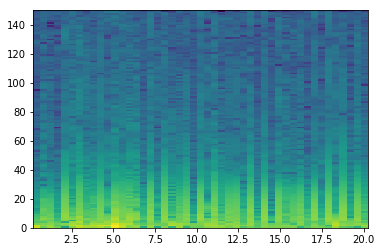

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 

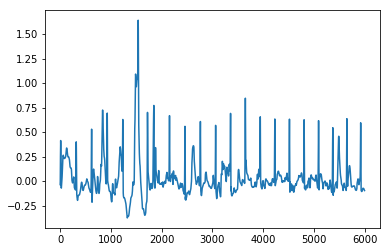

A00174
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


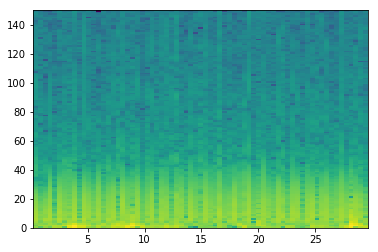

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16], [18, 19, 20, 21, 22, 23, 24, 25, 26], [28, 29, 30, 31, 32, 33, 34], [36, 37, 38, 39], [41, 42, 43, 44, 45], [47, 48, 49, 50, 51, 52, 53, 54, 55, 56]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
theMin
0
theMax
2100


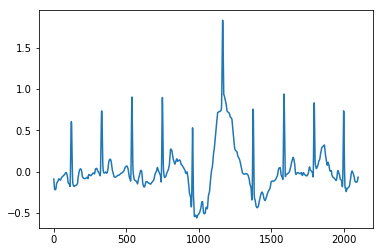

A00175
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


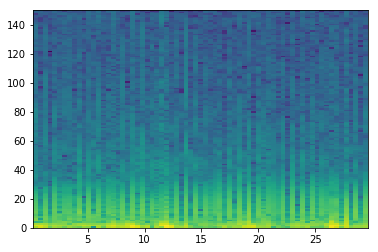

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

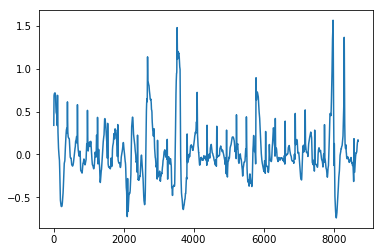

A00177
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


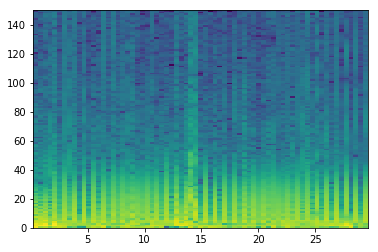

good List
[0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6], [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29], [31, 32, 33, 34, 35, 36, 37, 38], [40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]]
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
longest
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
indexList
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
theMin
900
theMax
3900


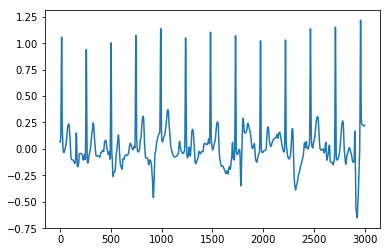

A00178
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24      ]


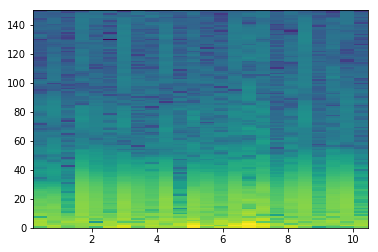

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
theMin
0
theMax
3000


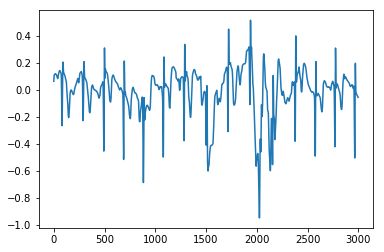

A00179
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


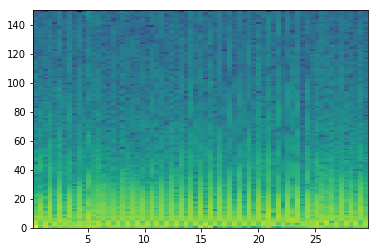

good List
[0, 1, 2, 4, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 37, 39, 40, 41, 42, 43, 44, 45, 47, 49, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 65, 66, 68]
[1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2]
the temp 3
[[1, 2], [], [5, 6, 7, 8, 9, 10], [12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26], [28, 29, 30, 31], [], [34, 35, 36, 37, 38, 39], [], [], [43, 44, 45, 46], [], [49, 50, 51, 52, 53, 54, 55]]
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
longest
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
indexList
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
theMin
1800
theMax
3600


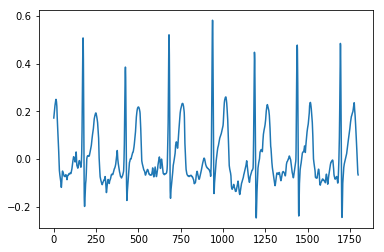

A00180
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


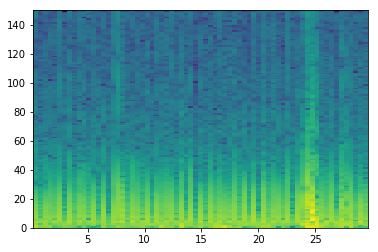

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 59, 60, 61, 62, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 1, 1, 1, 3, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54], [56, 57, 58]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28,

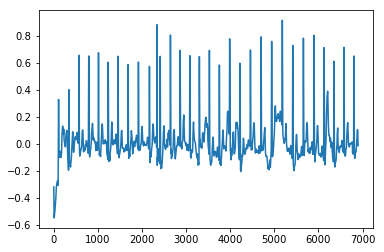

A00182
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

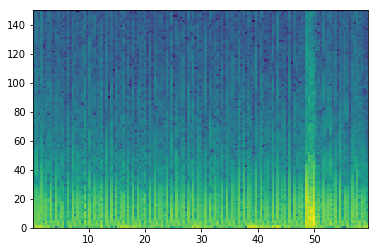

good List
[2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 20, 22, 24, 25, 26, 27, 28, 29, 31, 33, 34, 35, 36, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 58, 60, 61, 62, 63, 64, 65, 66, 67, 69, 70, 71, 72, 74, 75, 76, 77, 79, 80, 81, 82, 83, 84, 85, 86, 88, 90, 91, 92, 93, 95, 96, 97, 98, 100, 101, 102, 103, 104, 105, 107, 108, 109, 110, 111, 112, 117, 118, 119, 120, 124, 125, 126, 128, 129, 130, 131, 133, 134, 135, 137, 138]
[2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 5, 1, 1, 1, 4, 1, 1, 2, 1, 1, 1, 2, 1, 1, 2, 1]
the temp 3
[[], [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [14, 15, 16], [], [19, 20, 21, 22, 23], [], [26, 27, 28], [30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47], [], [50, 51, 5

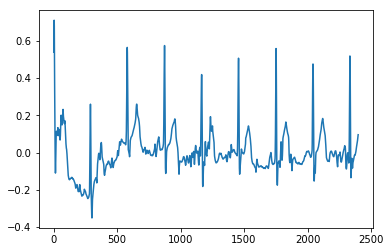

A00183
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


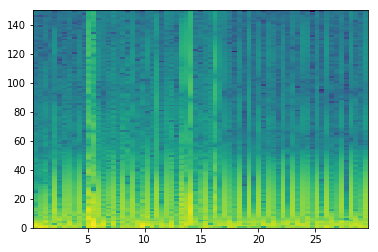

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 13, 14, 15, 16, 17, 21, 22, 24, 26, 29, 33, 34, 36, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 4, 1, 2, 2, 3, 4, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10], [12, 13, 14, 15], [17], [], [], [], [22], [], [25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]]
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
longest
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
indexList
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
theMin
4800
theMax
8100


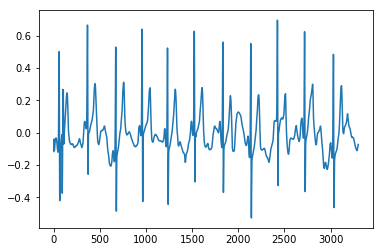

A00184
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


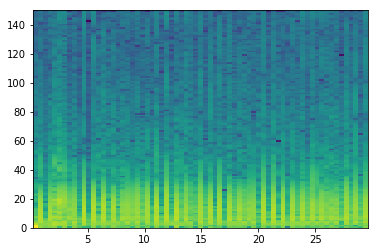

good List
[0, 2, 3, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[2, 1, 3, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[], [2], [4, 5, 6, 7, 8, 9], [11, 12, 13, 14, 15, 16, 17, 18, 19, 20]]
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
longest
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
indexList
[14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
theMin
1800
theMax
3000


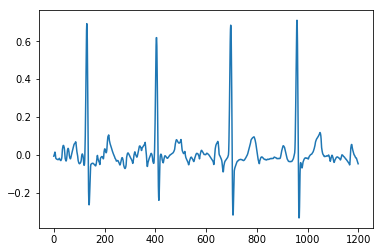

A00185
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


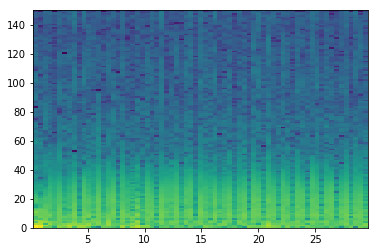

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

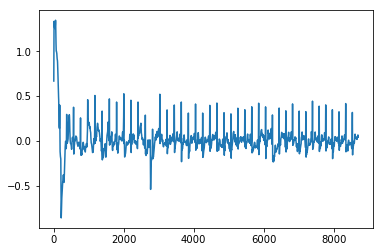

A00188
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


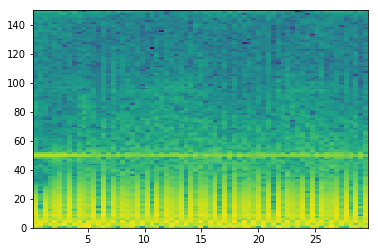

good List
[]
[]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


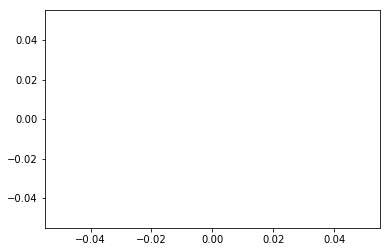

A00190
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


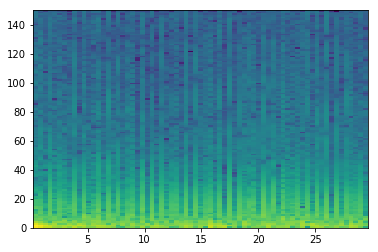

good List
[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2], [4, 5, 6, 7, 8, 9, 10, 11]]
[4, 5, 6, 7, 8, 9, 10, 11, 12]
longest
[4, 5, 6, 7, 8, 9, 10, 11, 12]
indexList
[4, 5, 6, 7, 8, 9, 10, 11, 12]
theMin
600
theMax
1500


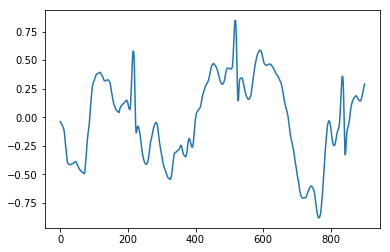

A00191
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


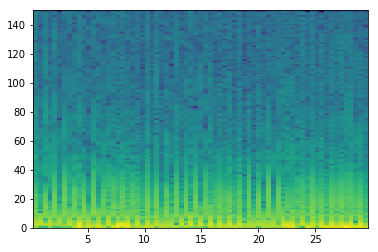

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

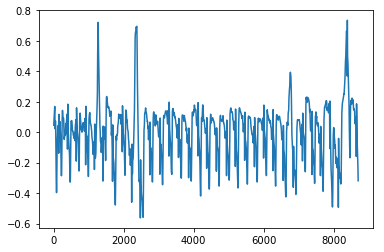

A00192
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


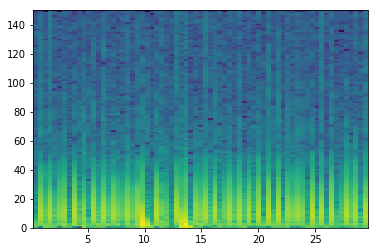

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

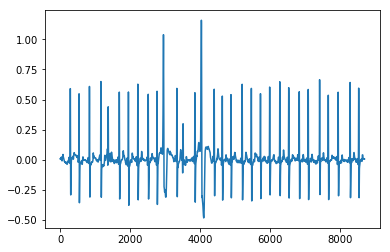

A00193
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


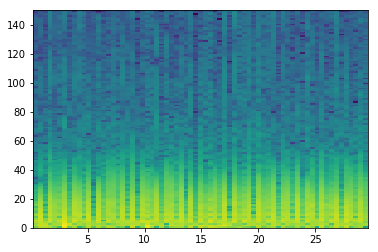

good List
[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 35, 36, 37, 38, 39, 40, 41, 42, 43, 45, 47, 49, 50, 51, 53, 54, 55, 56, 58, 60, 61, 62, 63, 64, 65, 66, 68]
[1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 2]
the temp 3
[[1, 2], [4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15], [], [18, 19, 20, 21, 22, 23, 24, 25], [27, 28], [30, 31, 32, 33, 34, 35, 36, 37], [], [], [41, 42], [44, 45, 46], [], [49, 50, 51, 52, 53, 54]]
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
longest
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
indexList
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
theMin
600
theMax
2100


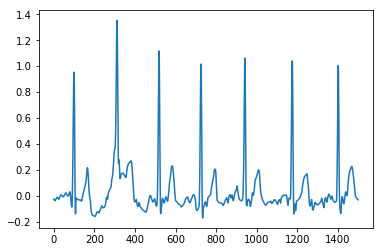

A00194
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


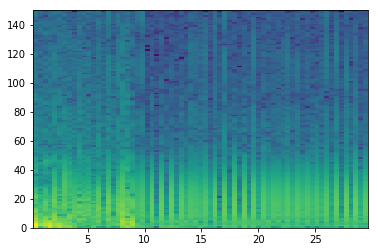

good List
[1, 2, 3, 8, 10, 12, 14, 16, 17, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 67, 68]
[1, 1, 5, 2, 2, 2, 2, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1]
the temp 3
[[1, 2], [], [], [], [], [8], [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28], [30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]]
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
longest
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
indexList
[42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
theMin
5400
theMax
8400


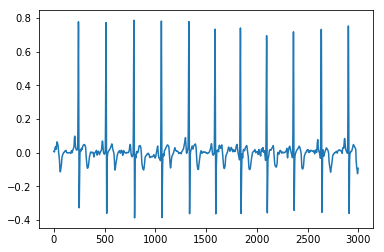

A00197
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


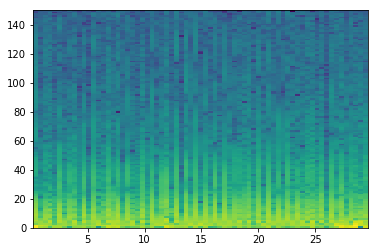

good List
[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4], [6, 7, 8, 9, 10, 11, 12, 13], [15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26], [], [], [30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51], [53, 54, 55, 56]]
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
longest
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
indexList
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
theMin
4200
theMax
7200


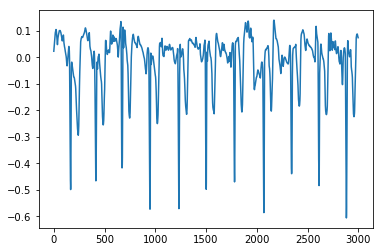

A00199
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


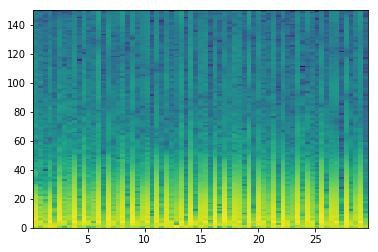

good List
[0, 1, 2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 19, 21, 22, 24, 26, 27, 28, 29, 30, 31, 33, 34, 36, 37, 38, 39, 40, 42, 43, 45, 46, 47, 48, 50, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 65, 66, 68]
[1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 2, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 2, 2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 2]
the temp 3
[[1, 2, 3, 4], [6, 7, 8], [10, 11, 12, 13, 14, 15], [], [18], [], [21, 22, 23, 24, 25], [27], [29, 30, 31, 32], [34], [36, 37, 38], [], [41], [43, 44, 45], [47, 48, 49], [51]]
[11, 12, 13, 14, 15, 16, 17]
longest
[11, 12, 13, 14, 15, 16, 17]
indexList
[11, 12, 13, 14, 15, 16, 17]
theMin
1500
theMax
2100


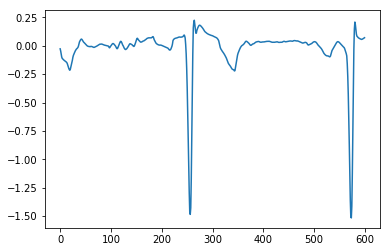

A00200
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


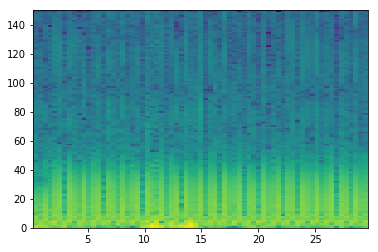

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22], []]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
theMin
0
theMax
2700


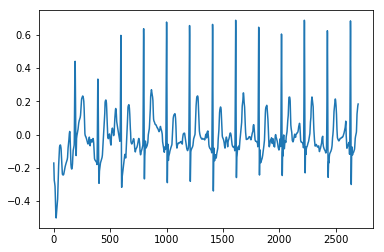

A00202
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

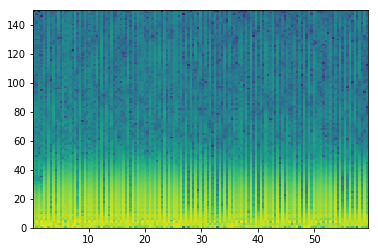

good List
[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 

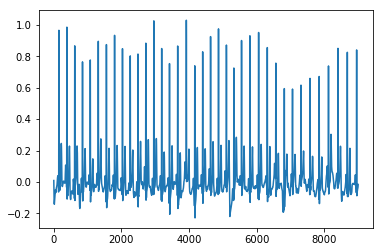

A00206
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


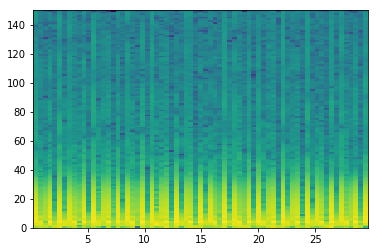

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

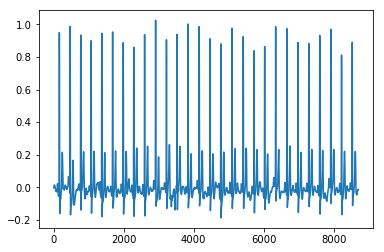

A00207
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


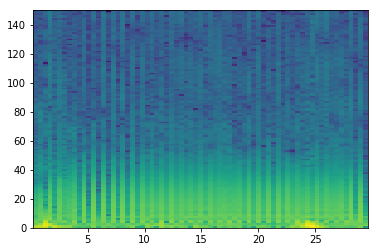

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
theMin
0
theMax
2400


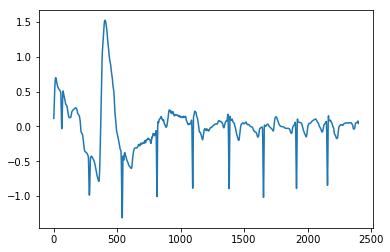

A00210
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


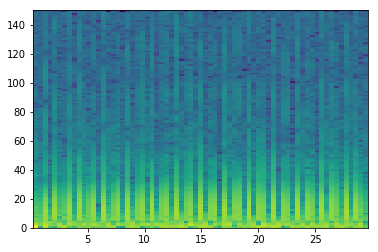

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

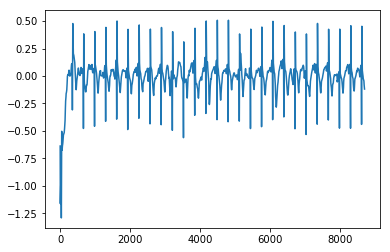

A00214
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333]


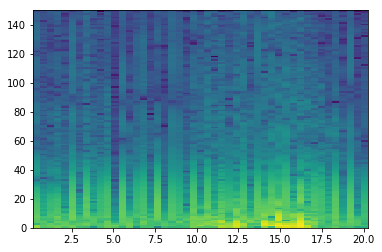

good List
[0, 1, 2, 3, 4, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 30, 36, 41, 43, 45, 46]
[1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 6, 5, 2, 2, 1]
the temp 3
[[1, 2, 3, 4], [], [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25], [], [], [], []]
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
longest
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
indexList
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
theMin
900
theMax
3300


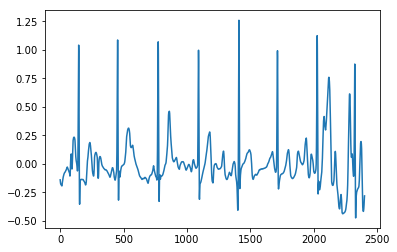

A00219
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


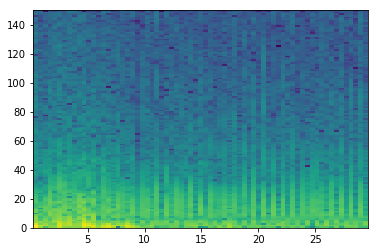

good List
[1, 2, 6, 7, 8, 9, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68]
[1, 4, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1]
the temp 3
[[1], [3, 4, 5], [7, 8], [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40], [42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]]
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
longest
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
indexList
[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 3

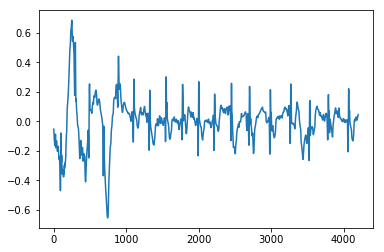

A00221
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24      ]


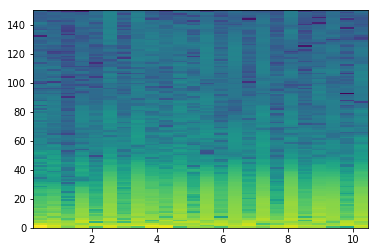

good List
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
longest
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
indexList
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
theMin
0
theMax
3000


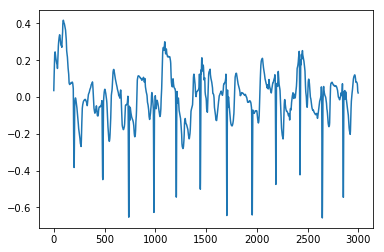

A00222
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


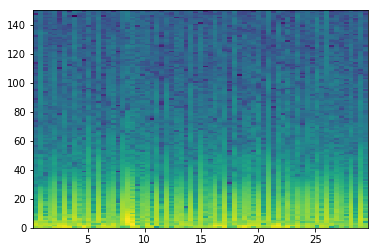

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10], [12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46], [48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]]
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
longest
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 

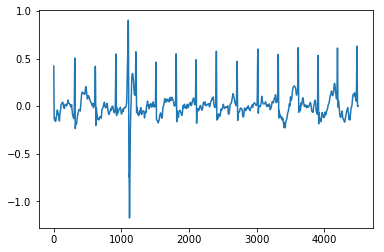

A00223
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


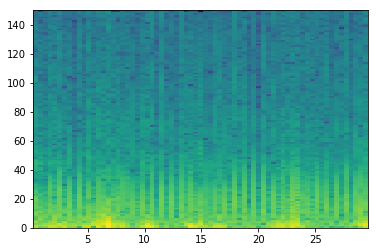

good List
[2, 4, 5, 6, 8, 9, 10, 12, 14, 16, 18, 19, 21, 24, 25, 27, 28, 29, 31, 32, 33, 35, 36, 37, 38, 39, 40, 41, 42, 44, 46, 47, 48, 50, 52, 55, 56, 57, 58, 59, 61, 62, 63, 64, 65]
[2, 1, 1, 2, 1, 1, 2, 2, 2, 2, 1, 2, 3, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 3, 1, 1, 1, 1, 2, 1, 1, 1, 1]
the temp 3
[[], [2, 3], [5, 6], [], [], [], [11], [], [14], [16, 17], [19, 20], [22, 23, 24, 25, 26, 27, 28], [], [31, 32], [], [], [36, 37, 38, 39]]
[35, 36, 37, 38, 39, 40, 41, 42]
longest
[35, 36, 37, 38, 39, 40, 41, 42]
indexList
[35, 36, 37, 38, 39, 40, 41, 42]
theMin
4500
theMax
5400


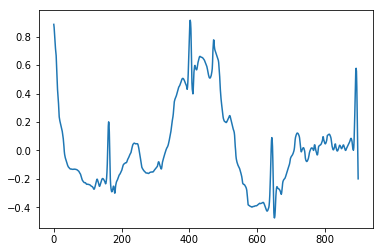

A00224
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667]


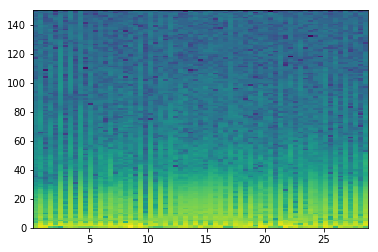

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
long

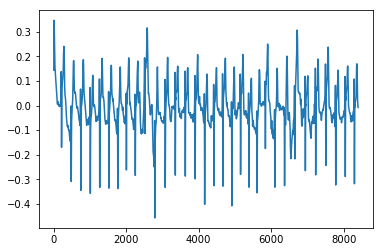

A00226
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


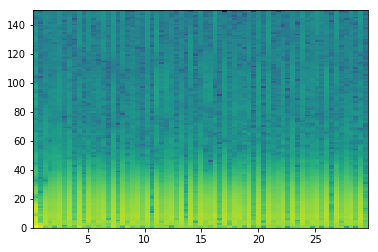

good List
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65,

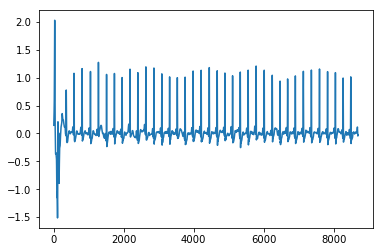

A00227
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


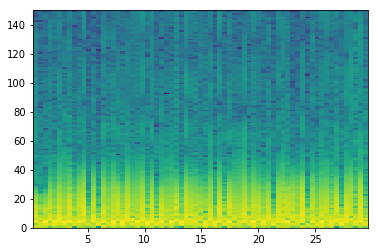

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42], [44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,

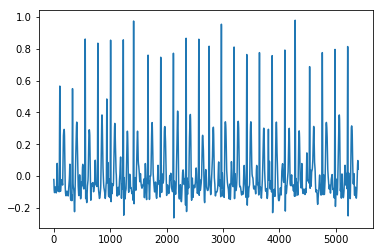

A00228
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


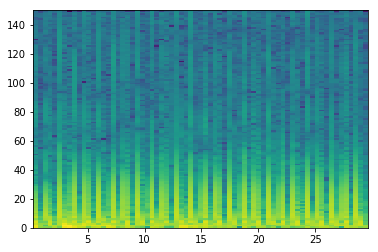

good List
[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4], [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], [21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]]
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
longest
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
indexList
[22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]
theMin
2700
theMax
5400


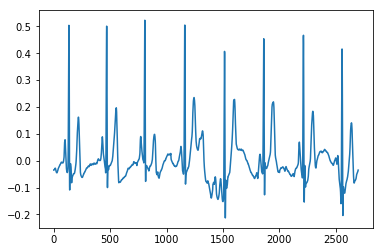

A00229
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


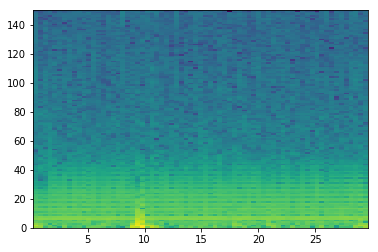

good List
[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2], [4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]]
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
longest
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
indexList
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
theMin
600
theMax
3000


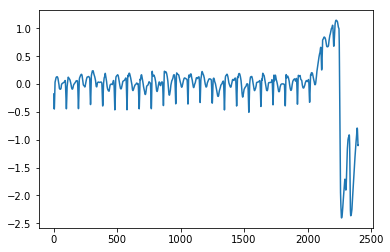

A00230
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


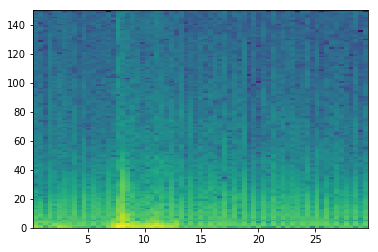

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 20, 21, 22, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16], [18, 19], [], [22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33], [35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]]
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
longest
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
indexList
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]
theMin
5100
theMax
7200


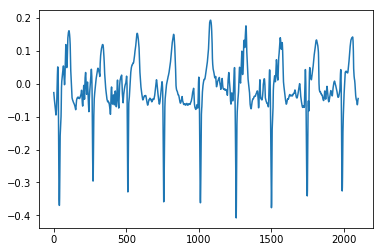

A00232
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


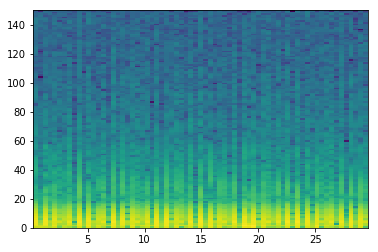

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8], [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30], [32, 33], [35, 36, 37, 38, 39]]
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]
longest
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]
indexList
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]
theMin
1200
theMax
3900


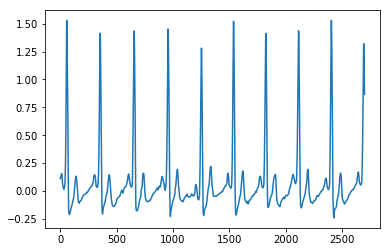

A00233
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


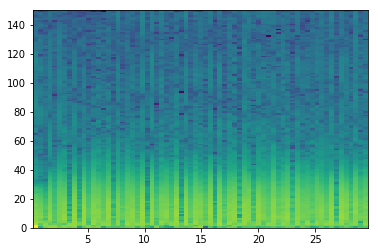

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

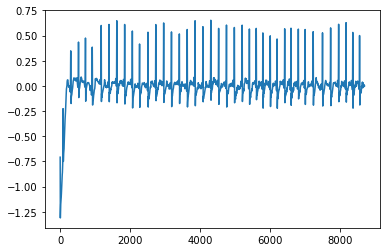

A00234
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


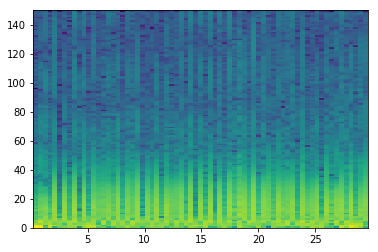

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 40, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35], [37, 38, 39, 40], [42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35]
indexList
[0

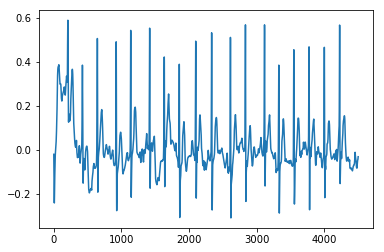

A00235
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64      ]


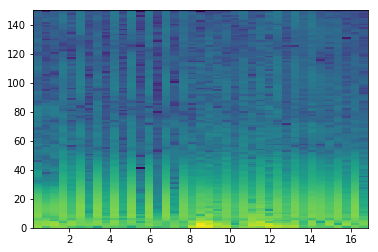

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 31, 32, 33, 34, 35, 36, 37, 38]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27], []]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
theMin
0
theMax
3300


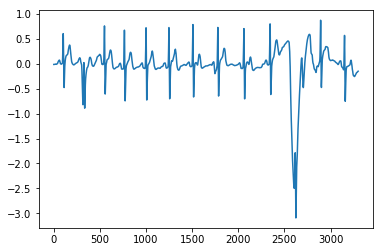

A00236
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8       ]


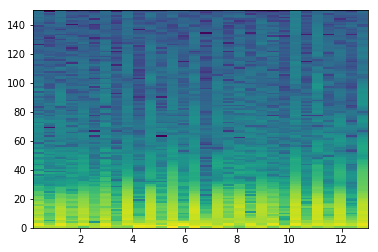

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
theMin
0
theMax
3600


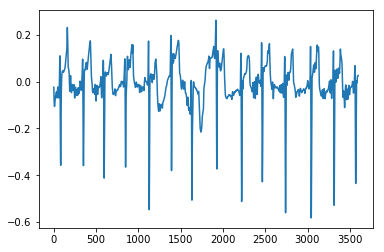

A00237
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


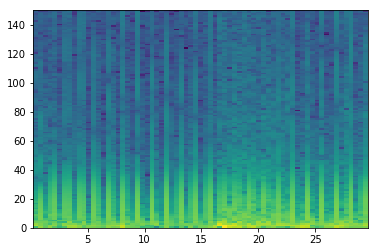

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23], [25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41], [43, 44, 45, 46, 47], [49]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
theMin
0
theMax
3000


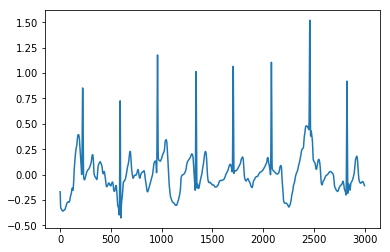

A00238
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


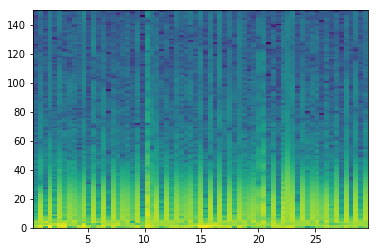

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22], [24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43], [45, 46], [48, 49, 50, 51, 52, 53, 54, 55, 56, 57]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
theMin
0
theMax
2700


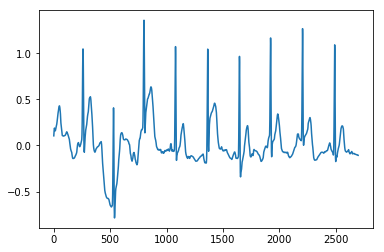

A00239
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667]


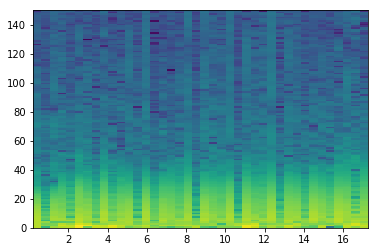

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
theMin
0
theMax
5100


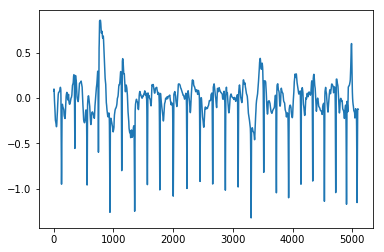

A00240
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


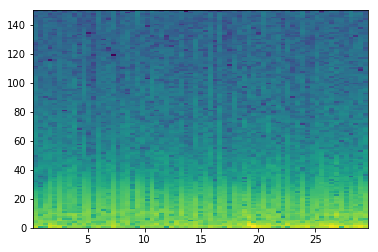

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24], [26, 27, 28, 29, 30, 31, 32, 33], [], [36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
theMin
0
theMax
3000


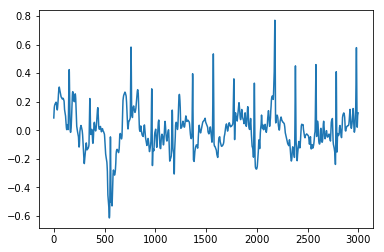

A00241
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

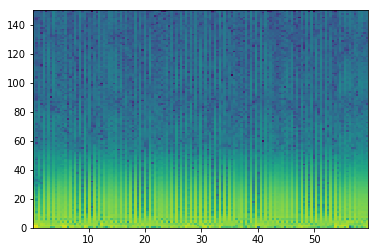

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

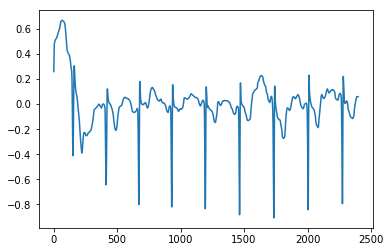

A00242
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


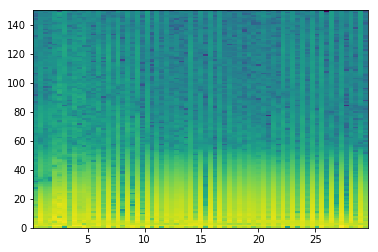

good List
[0, 1, 2, 3, 4, 7, 11, 12, 14, 16, 18, 20, 21, 22, 24, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 66, 67, 68]
[1, 1, 1, 1, 3, 4, 1, 2, 2, 2, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1]
the temp 3
[[1, 2, 3, 4], [], [7], [], [], [], [12, 13], [], [16, 17, 18, 19, 20, 21, 22], [], [], [26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38], [40, 41, 42, 43, 44, 45, 46, 47], []]
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
longest
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
indexList
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
theMin
5100
theMax
6600


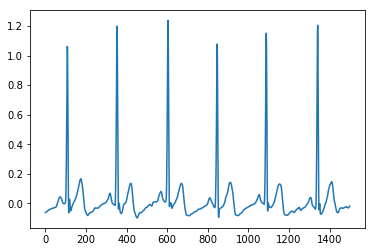

A00244
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


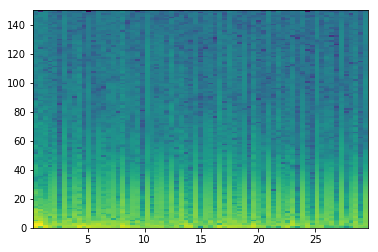

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

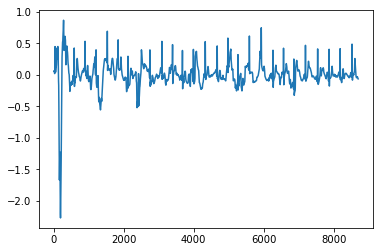

A00245
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

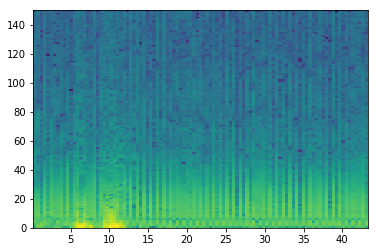

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 8, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13], [15, 16, 17, 18, 19]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
theMin
0
theMax
1500


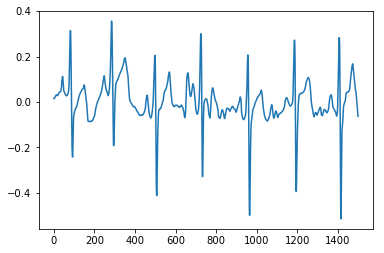

A00248
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


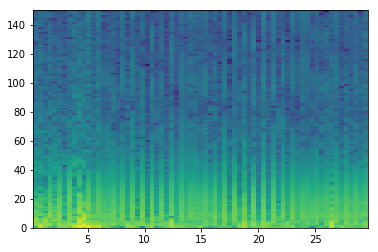

good List
[2, 12, 14, 15, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 29, 31, 32, 33, 34, 35, 36, 38, 40, 41, 42, 44, 45, 46, 48, 50, 52, 53, 54, 55, 56, 57, 59, 60, 61, 63, 64, 65, 66, 67, 68]
[10, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1]
the temp 3
[[], [], [3], [5, 6, 7, 8], [10, 11, 12, 13], [], [16, 17, 18, 19, 20], [], [23, 24], [26, 27], [], [], [31, 32, 33, 34, 35], [37, 38]]
[31, 32, 33, 34, 35, 36]
longest
[31, 32, 33, 34, 35, 36]
indexList
[31, 32, 33, 34, 35, 36]
theMin
3900
theMax
4500


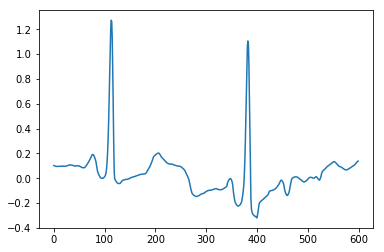

A00249
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


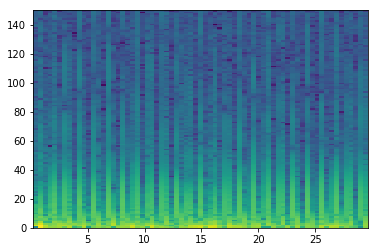

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

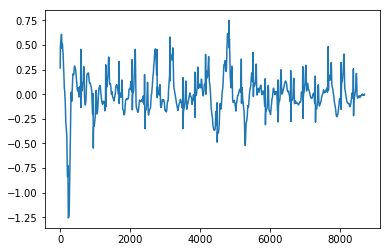

A00250
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

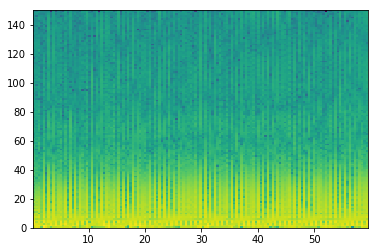

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

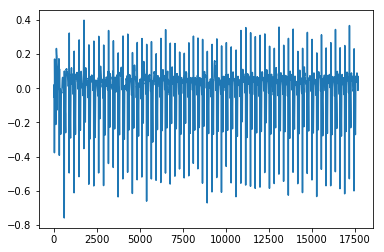

A00254
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


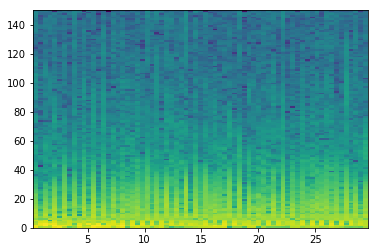

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

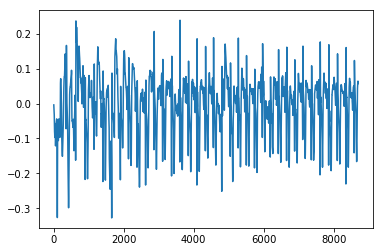

A00256
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


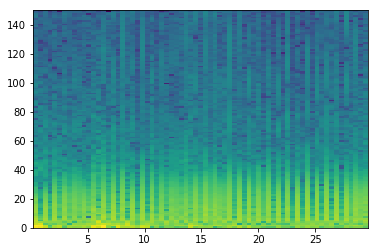

good List
[0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 27, 28, 29, 30, 32, 33, 34, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1], [3, 4, 5, 6, 7, 8, 9, 10, 11], [13, 14, 15, 16, 17, 18, 19, 20], [22, 23, 24, 25, 26], [28, 29], [31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49], [51, 52]]
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
longest
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
indexList
[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
theMin
4500
theMax
6900


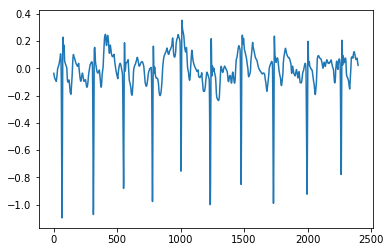

A00257
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333]


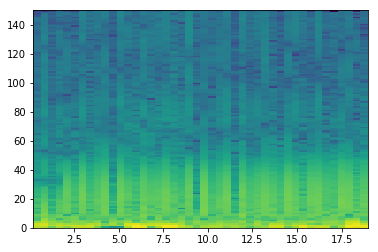

good List
[0, 1, 2, 3, 4, 5, 7, 8, 10, 13, 14, 15, 16, 18, 19, 20, 21, 23, 24, 26, 28, 29, 30, 31, 32, 34, 35, 38, 39, 42]
[1, 1, 1, 1, 1, 2, 1, 2, 3, 1, 1, 1, 2, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1, 2, 1, 3, 1, 3]
the temp 3
[[1, 2, 3, 4, 5], [7], [], [10, 11, 12], [14, 15, 16], [18], [], [21, 22, 23, 24], [26], [28]]
[0, 1, 2, 3, 4, 5]
longest
[0, 1, 2, 3, 4, 5]
indexList
[0, 1, 2, 3, 4, 5]
theMin
0
theMax
600


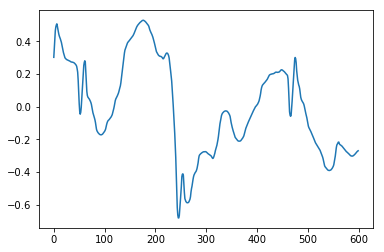

A00258
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667]


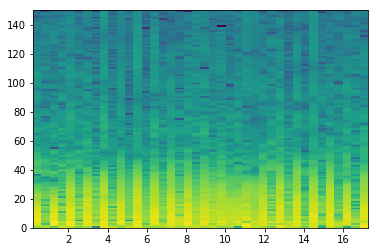

good List
[1, 3, 7, 9, 10, 11, 12, 13, 15, 17, 19, 21, 22, 23, 24, 25, 26, 30, 32, 33, 34, 36, 38]
[2, 4, 2, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 4, 2, 1, 1, 2, 2]
the temp 3
[[], [], [], [4, 5, 6, 7], [], [], [], [12, 13, 14, 15, 16], [], [19, 20], []]
[21, 22, 23, 24, 25, 26]
longest
[21, 22, 23, 24, 25, 26]
indexList
[21, 22, 23, 24, 25, 26]
theMin
2700
theMax
3300


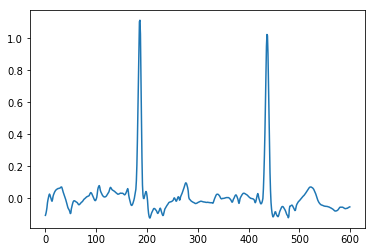

A00261
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

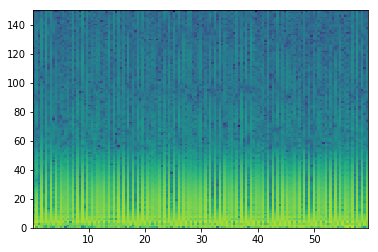

good List
[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

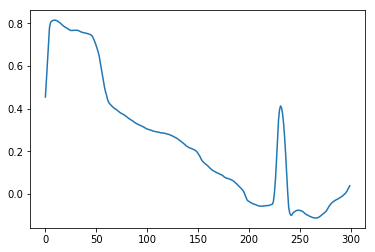

A00262
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


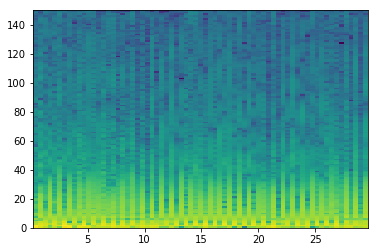

good List
[0, 3, 4, 5, 6, 7, 8, 11, 12, 13, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 67, 68]
[3, 1, 1, 1, 1, 1, 3, 1, 1, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1]
the temp 3
[[], [2, 3, 4, 5, 6], [8, 9], [11, 12], [], [15, 16, 17, 18, 19, 20], [22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33], [35, 36, 37, 38, 39, 40, 41, 42, 43], [45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]]
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]
longest
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]
indexList
[29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]
theMin
3600
theMax
5100


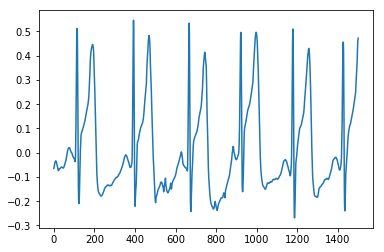

A00263
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


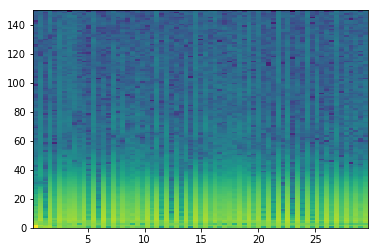

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

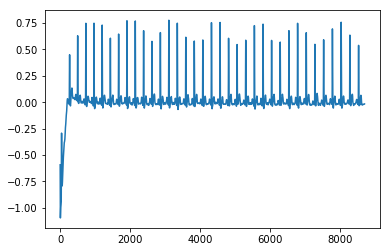

A00265
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


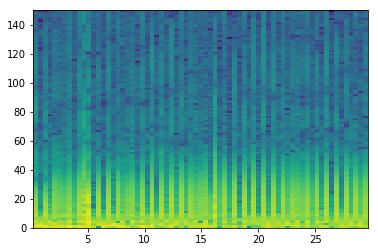

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9], [11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21], [], [24, 25, 26, 27, 28, 29, 30, 31, 32], [34, 35, 36, 37, 38, 39]]
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
longest
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
indexList
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
theMin
1500
theMax
3000


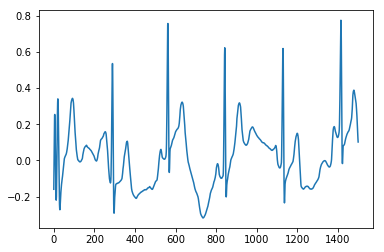

A00266
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


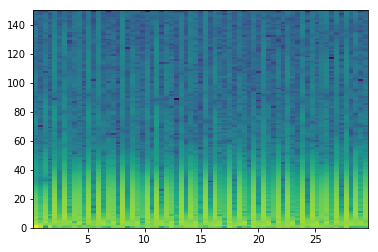

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

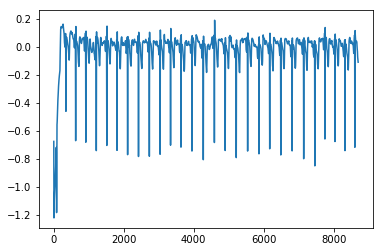

A00269
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


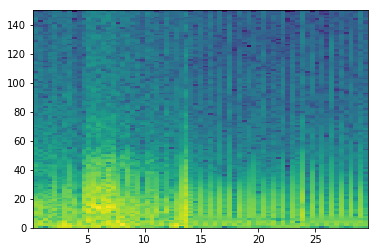

good List
[5, 8, 9, 21, 22, 25, 26, 28, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[3, 1, 12, 1, 3, 1, 2, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[], [2], [4], [6], [], [9, 10, 11, 12, 13, 14, 15, 16, 17], [19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]]
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
longest
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
indexList
[43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
theMin
5400
theMax
6900


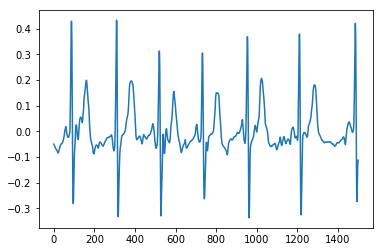

A00272
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


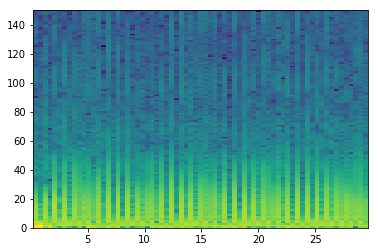

good List
[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 51, 53, 54, 55, 56, 57, 59, 60, 61, 62, 63, 64, 65, 66, 68]
[1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2]
the temp 3
[[1, 2, 3, 4, 5, 6, 7], [9, 10, 11, 12, 13, 14, 15], [17, 18, 19, 20, 21, 22, 23, 24, 25], [27, 28, 29, 30, 31, 32, 33, 34, 35], [37, 38, 39, 40, 41, 42, 43, 44, 45], [], [48, 49, 50, 51], [53, 54, 55, 56, 57, 58, 59]]
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
longest
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
indexList
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
theMin
2400
theMax
3300


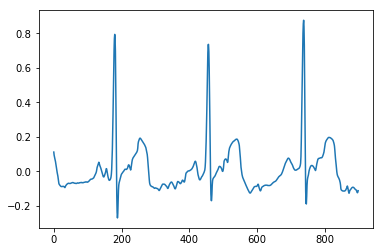

A00273
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


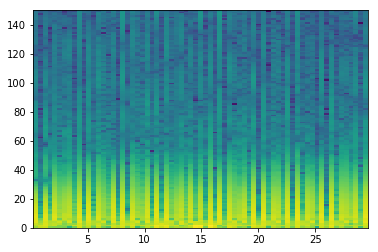

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8], [10, 11, 12, 13, 14, 15, 16], [], [19, 20, 21, 22, 23], [25, 26, 27, 28, 29, 30, 31], [33, 34], [36, 37, 38], [40, 41, 42, 43, 44], []]
[0, 1, 2, 3, 4, 5, 6, 7, 8]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8]
theMin
0
theMax
900


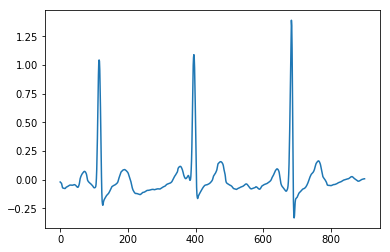

A00274
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


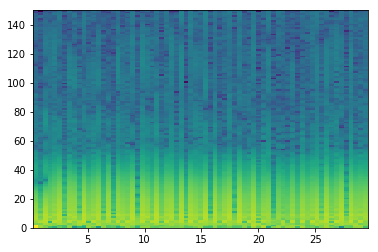

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21], [23], [25, 26, 27, 28, 29, 30, 31, 32, 33, 34], [36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]]
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
longest
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
indexList
[38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
theMin

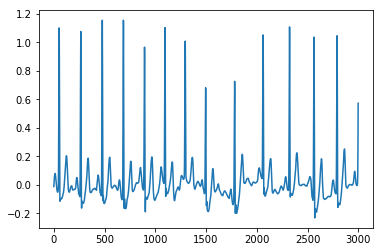

A00275
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

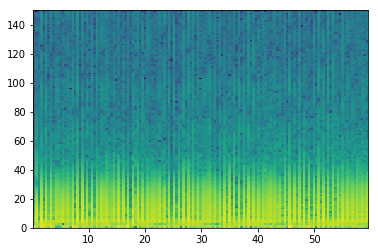

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

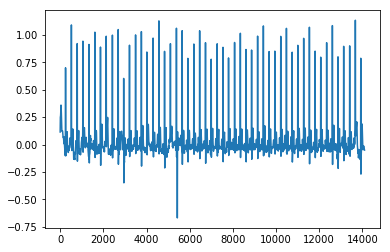

A00276
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


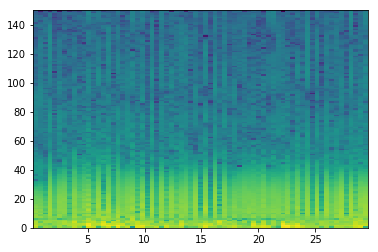

good List
[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7]]
[0, 1, 2, 3, 4, 5, 6, 7]
longest
[0, 1, 2, 3, 4, 5, 6, 7]
indexList
[0, 1, 2, 3, 4, 5, 6, 7]
theMin
0
theMax
900


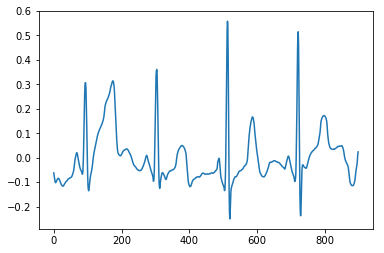

A00277
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


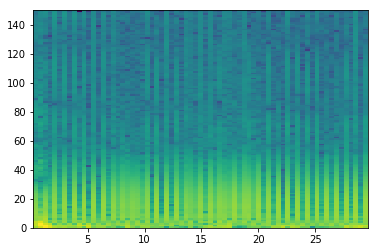

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

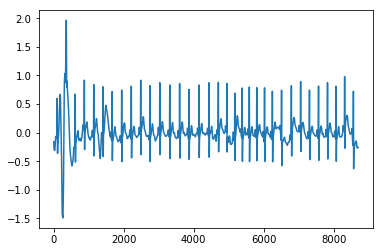

A00279
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


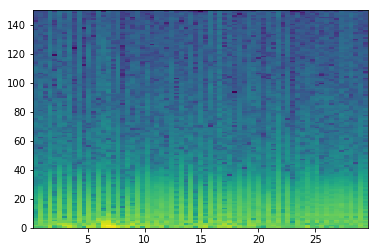

good List
[0, 1, 2, 4, 5, 6, 8, 10, 12, 13, 14, 16, 18, 20, 21, 22, 24, 25, 26, 27, 29, 30, 31, 33, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 49, 51, 53, 55, 56, 57, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 2, 1, 1, 2, 2, 2, 1, 1, 2, 2, 2, 1, 1, 2, 1, 1, 1, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2], [4, 5], [], [], [9, 10], [], [], [14, 15], [17, 18, 19], [21, 22], [], [25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36], [], [], [], [41, 42]]
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
longest
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
indexList
[35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
theMin
4500
theMax
6000


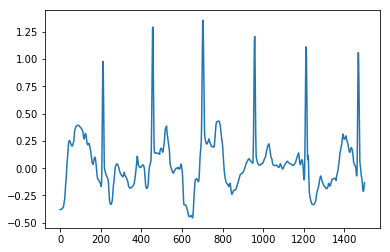

A00280
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


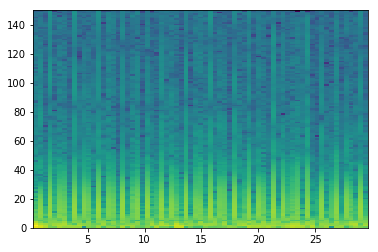

good List
[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2], [4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24], [26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]]
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]
longest
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]
indexList
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]
theMin
600
theMax
3300


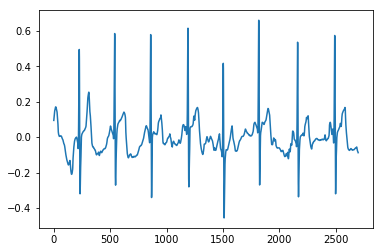

A00281
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


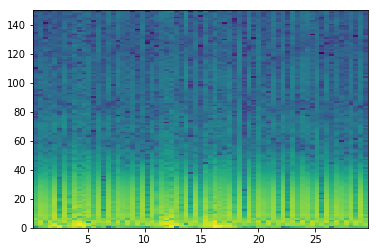

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

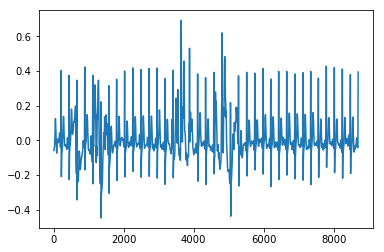

A00283
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


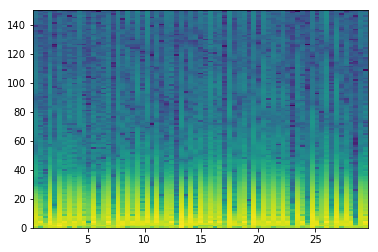

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

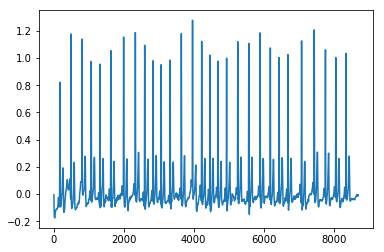

A00284
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

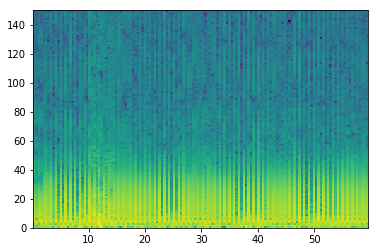

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 26, 28, 29, 30, 31, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 88, 89, 90, 91, 92, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 4, 2, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14], [16, 1

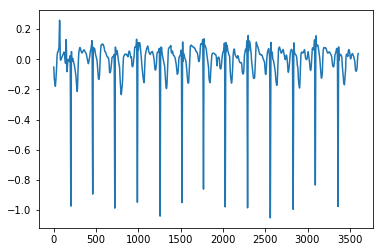

A00287
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


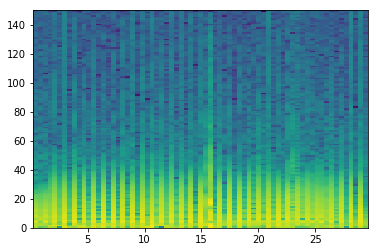

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34], [36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 1

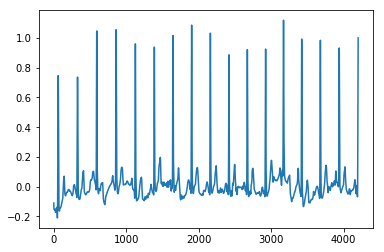

A00289
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


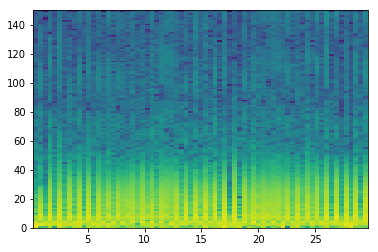

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21

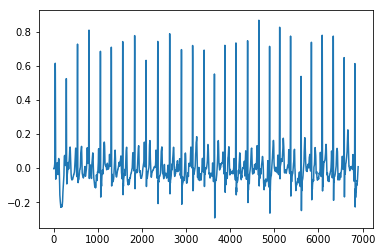

A00290
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


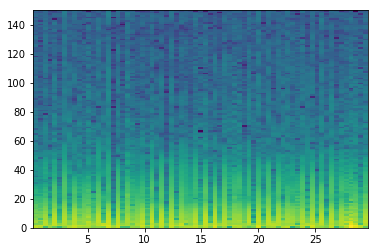

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 16, 17, 18, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [], [15, 16], [18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]]
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
longest
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
ind

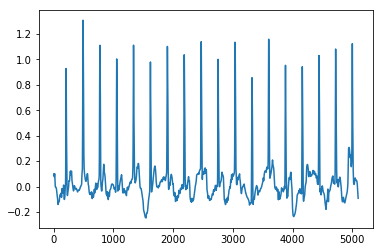

A00292
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667]


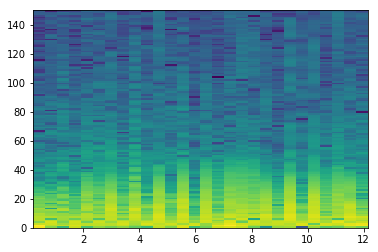

good List
[0, 1, 2, 3, 7, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 22, 23, 24, 25, 26, 27]
[1, 1, 1, 4, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3], [], [6, 7], [9, 10, 11, 12, 13, 14, 15]]
[13, 14, 15, 16, 17, 18, 19, 20]
longest
[13, 14, 15, 16, 17, 18, 19, 20]
indexList
[13, 14, 15, 16, 17, 18, 19, 20]
theMin
1500
theMax
2400


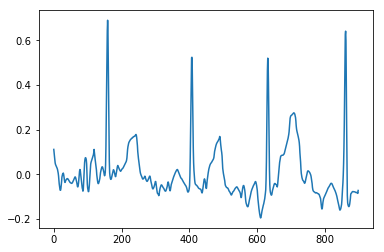

A00294
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


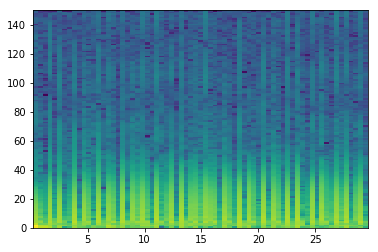

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

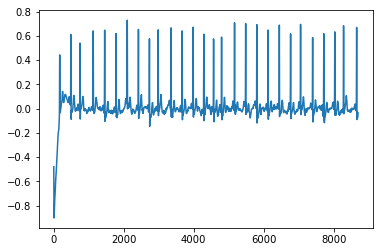

A00295
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


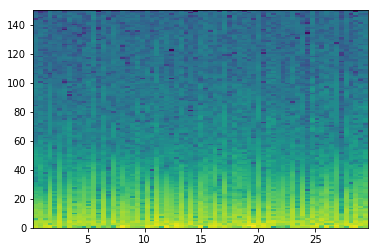

good List
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37]]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
longest
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
indexList
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 

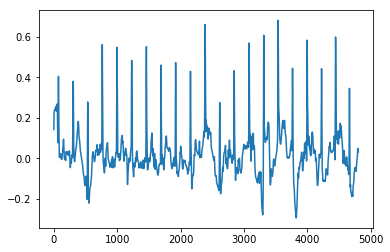

A00297
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


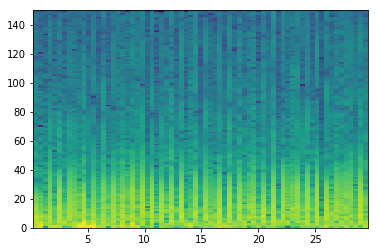

good List
[0, 1, 2, 4, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 68]
[1, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2]
the temp 3
[[1, 2], [], [5, 6, 7], [9, 10, 11, 12, 13, 14, 15, 16], [], [19, 20, 21, 22], [24, 25, 26, 27, 28, 29, 30, 31, 32, 33], [35, 36, 37, 38, 39, 40, 41], [43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]]
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
longest
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
indexList
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
theMin
6300
theMax
8400


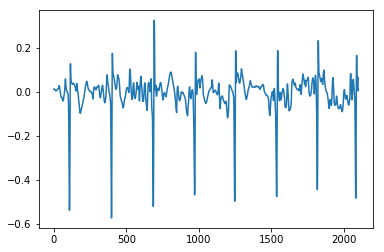

A00299
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


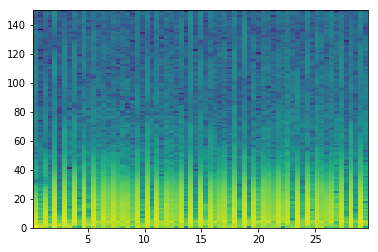

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22], [24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41], [43, 44, 45, 46, 47, 48, 49], [51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
theMin
0
theMax
2700


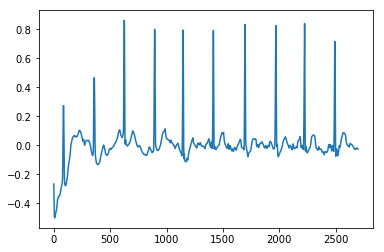

A00302
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


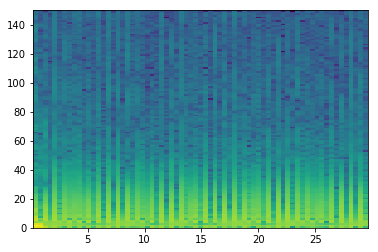

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

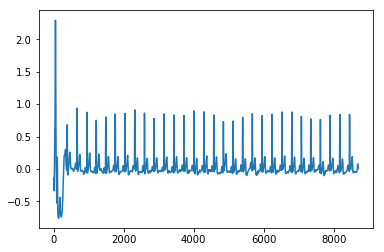

A00303
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16      ]


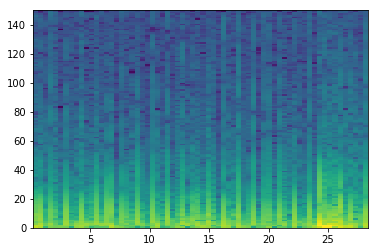

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 65]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28], [30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54], []]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28

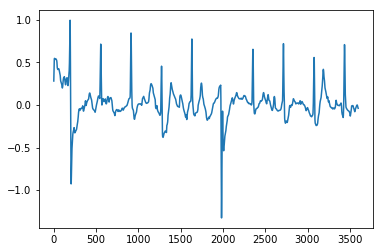

A00304
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

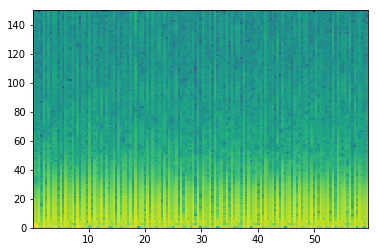

good List
[1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 67, 68, 69, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 83, 84, 85, 86, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2], [4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 

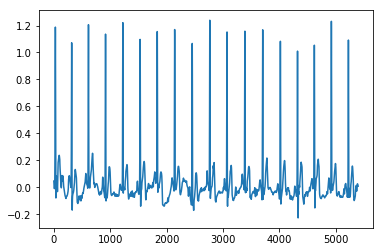

A00305
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


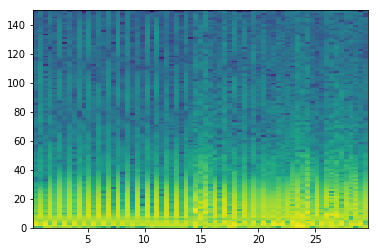

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 32, 33, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 57, 58, 59, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 5, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28], [30, 31, 32], [], [35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50], [52, 53]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
theMin
0
theMax
3600


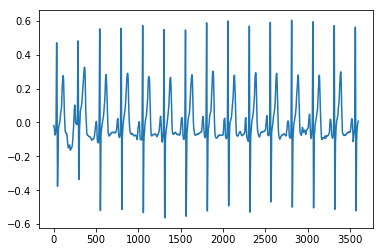

A00306
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


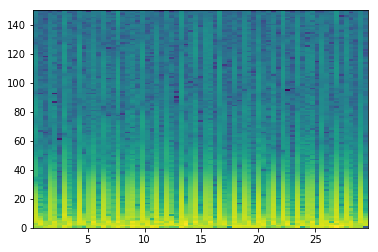

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

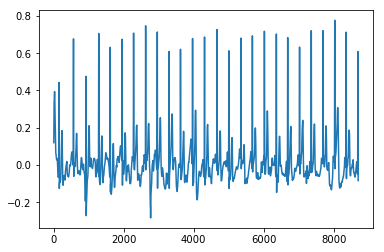

A00309
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


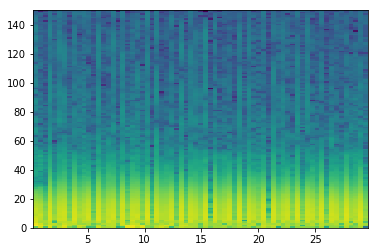

good List
[0, 2, 4, 7, 9, 10, 11, 12, 14, 17, 19, 20, 22, 24, 26, 27, 28, 29, 31, 32, 33, 34, 36, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 50, 51, 52, 53, 55, 56, 57, 58, 60, 62, 63, 65, 68]
[2, 2, 3, 2, 1, 1, 1, 2, 3, 2, 1, 2, 2, 2, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, 3]
the temp 3
[[], [], [], [], [5, 6, 7], [], [], [11], [], [], [15, 16, 17], [19, 20, 21], [], [24, 25, 26, 27, 28], [30, 31, 32], [34, 35, 36], [38, 39, 40], [], [43], []]
[38, 39, 40, 41, 42, 43]
longest
[38, 39, 40, 41, 42, 43]
indexList
[38, 39, 40, 41, 42, 43]
theMin
4800
theMax
5400


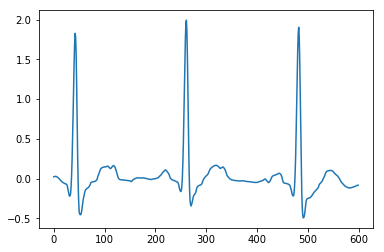

A00311
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

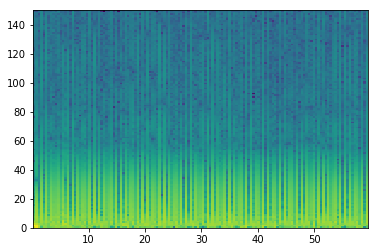

good List
[0, 1, 2, 4, 6, 7, 8, 9, 10, 11, 13, 14, 15, 17, 18, 19, 20, 21, 22, 24, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 66, 67, 68, 69, 70, 71, 72, 73, 75, 76, 77, 78, 79, 80, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 103, 104, 105, 106, 107, 108, 110, 112, 113, 114, 115, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137]
[1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2], [], [5, 6, 7, 8, 9], [11, 12], [14, 15, 16, 17, 18], [], [], [22, 23, 24, 25, 26, 27, 28, 29, 30], [32, 33, 34, 3

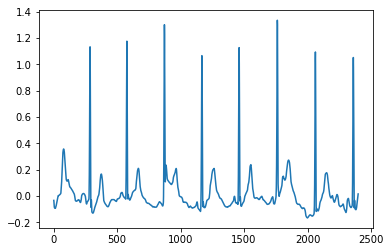

A00312
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


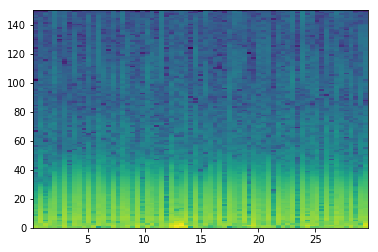

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 56, 57, 59, 61, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 2, 2, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [14, 15, 16], [18, 19, 20, 21, 22, 23, 24, 25], [27, 28, 29], [31, 32, 33], [], [36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48], [50], [], []]
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
longest
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
indexList
[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]
theMin
5100
theMax
6900


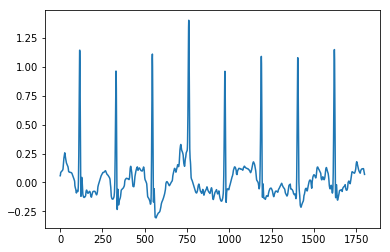

A00313
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

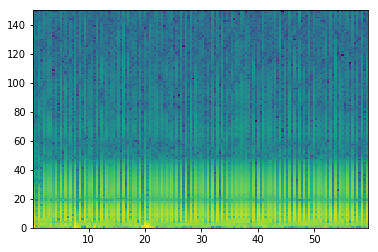

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

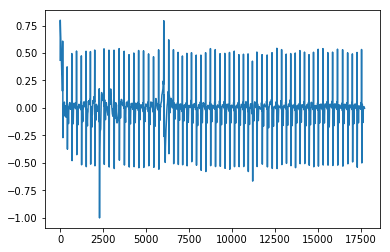

A00314
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667]


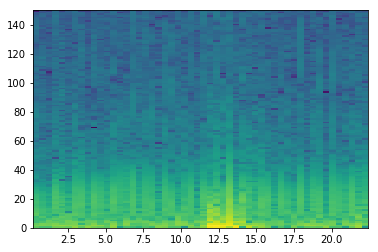

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 31, 34, 36, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49, 50, 51]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 3, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27], [], [], [31, 32, 33, 34, 35, 36, 37]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
longest
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
indexList
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
theMin
0
theMax
3300


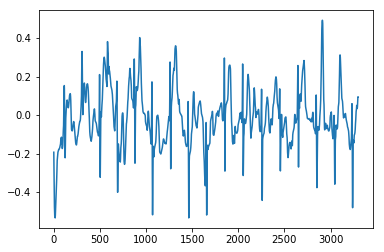

A00315
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


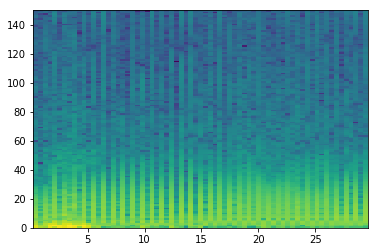

good List
[0, 1, 2, 3, 8, 9, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 61, 62, 63, 65, 66, 67, 68]
[1, 1, 1, 5, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1]
the temp 3
[[1, 2, 3], [5], [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20], [], [23, 24, 25, 26, 27, 28, 29, 30, 31, 32], [], [35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48], [50, 51]]
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
longest
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
indexList
[13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
theMin
1500
theMax
3300


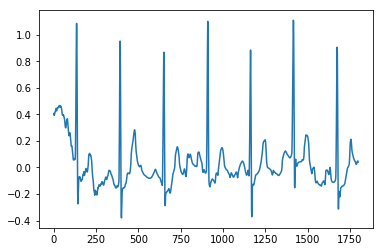

A00316
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333]


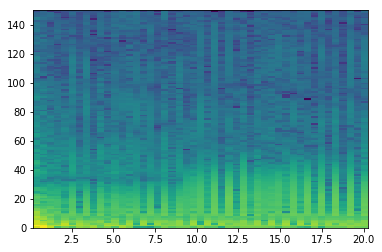

good List
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
longest
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
indexList
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,

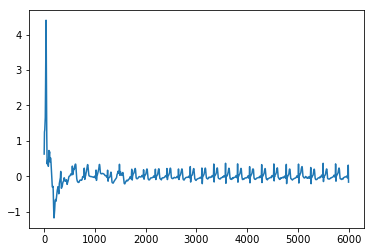

A00318
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


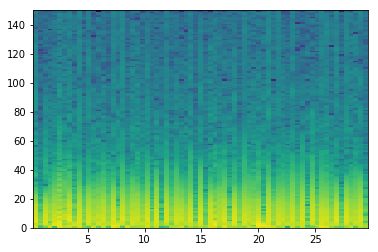

good List
[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 36, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4], [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30], [32, 33, 34]]
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]
longest
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]
indexList
[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]
theMin
600
theMax
3900


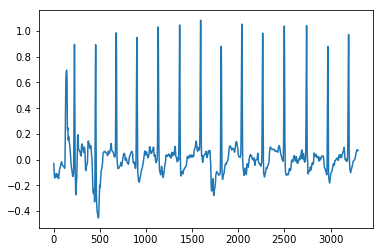

A00319
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


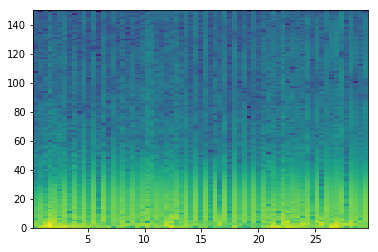

good List
[0, 1, 2, 3, 4, 5, 7, 9, 11, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 61, 63, 64, 66, 67, 68]
[1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 2, 1, 1]
the temp 3
[[1, 2, 3, 4, 5], [], [], [], [], [11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21], [23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34], [36, 37, 38, 39], [41, 42, 43, 44, 45, 46, 47], [], [], [], [52]]
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
longest
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
indexList
[28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
theMin
3600
theMax
5100


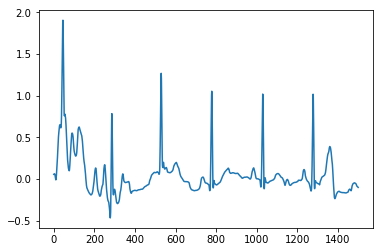

A00320
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


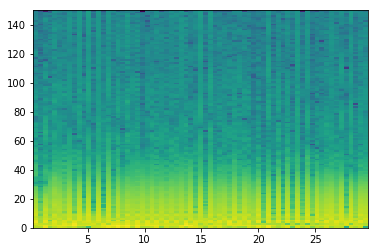

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

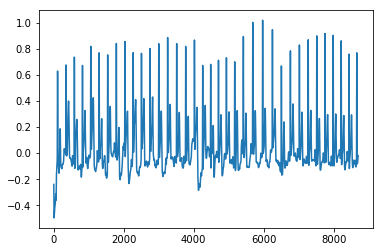

A00322
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


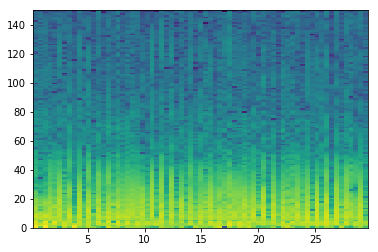

good List
[0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6], [8, 9], [11, 12, 13, 14], [16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36]]
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
longest
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
indexList
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
theMin
2400
theMax
5100


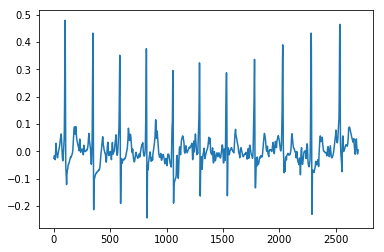

A00323
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333]


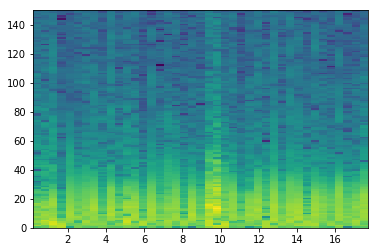

good List
[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
[1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3], [5, 6, 7, 8, 9], [11, 12, 13, 14, 15, 16, 17, 18]]
[12, 13, 14, 15, 16, 17, 18, 19, 20]
longest
[12, 13, 14, 15, 16, 17, 18, 19, 20]
indexList
[12, 13, 14, 15, 16, 17, 18, 19, 20]
theMin
1500
theMax
2400


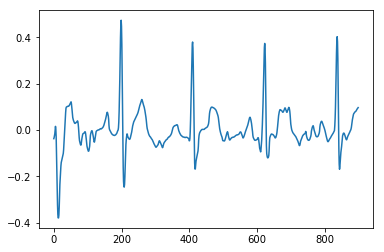

A00328
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


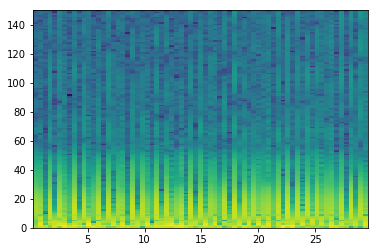

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

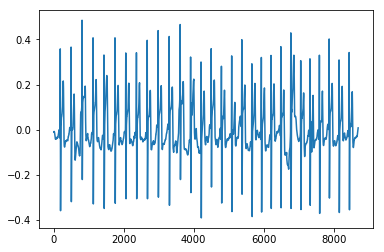

A00330
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


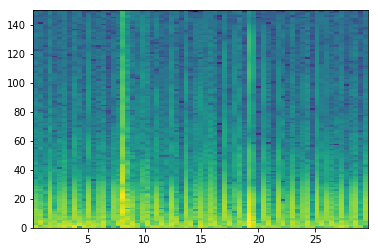

good List
[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 12, 13, 14, 15, 16, 17, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 46, 48, 49, 51, 52, 53, 54, 55, 56, 57, 59, 60, 61, 62, 63, 64, 65, 66, 67]
[1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 3, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 3, 2, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7], [9], [11, 12, 13, 14, 15], [17, 18], [20, 21, 22, 23, 24, 25], [27, 28, 29, 30, 31, 32, 33, 34, 35], [], [], [39], [41, 42, 43, 44, 45, 46]]
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41]
longest
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41]
indexList
[32, 33, 34, 35, 36, 37, 38, 39, 40, 41]
theMin
4200
theMax
5100


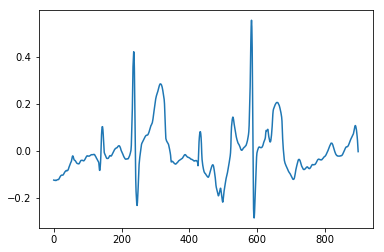

A00331
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667]


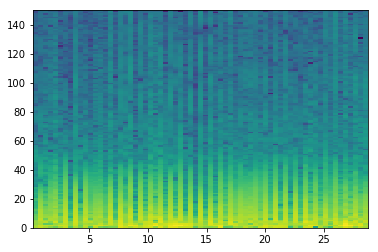

good List
[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 56, 57, 59, 60, 61, 62, 63, 64, 65, 66]
[1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3], [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21], [], [24, 25], [27, 28, 29, 30, 31, 32], [34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49], [51]]
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
longest
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
indexList
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
theMin
600
theMax
2700


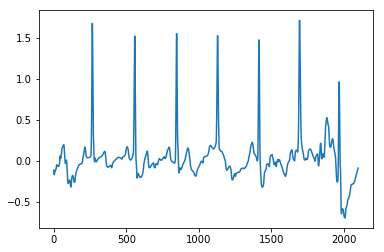

A00332
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


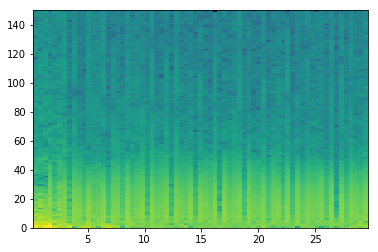

good List
[0, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
[7, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[], [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15], [], [18, 19, 20]]
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
longest
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
indexList
[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
theMin
900
theMax
2700


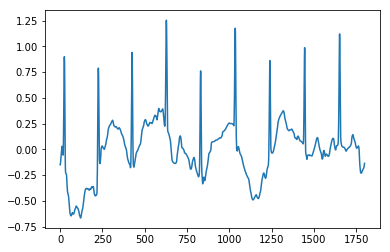

A00333
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


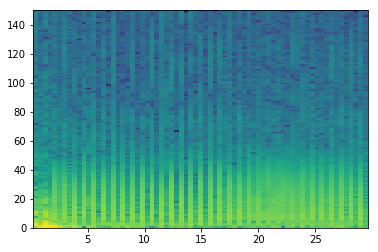

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 33, 35, 36, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9], [11, 12, 13, 14, 15, 16, 17, 18], [20, 21, 22, 23, 24, 25, 26, 27], [], [], [31, 32, 33, 34, 35, 36, 37, 38], [40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]]
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
longest
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
indexList
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
theMin
5700
theMax
7200


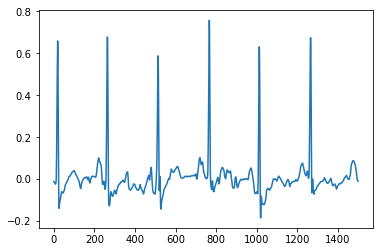

A00334
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


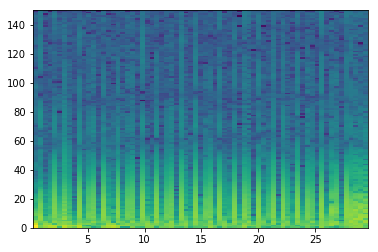

good List
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62

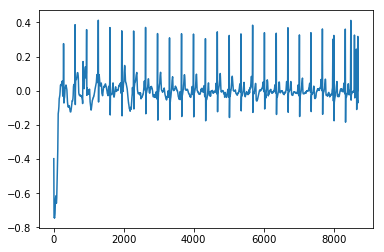

In [14]:
theCSV = open("200_set_of_Norm_AF_Rand.csv")
lineSkip = 0
for line in theCSV:
            #remove whitespace
    line = line.strip()
            #split up based off commas
    a,b,c,d = line.split(",")
            #if not at first line
    if(lineSkip != 0):
                #create plot diagram with ID at that line
        theStart(b)
    lineSkip += 1
#theStart("A00033")